# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = '/data'
!pip install matplotlib==2.0.2
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

You are using pip version 9.0.1, however version 18.0 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

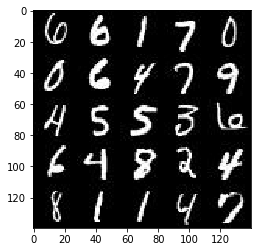

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

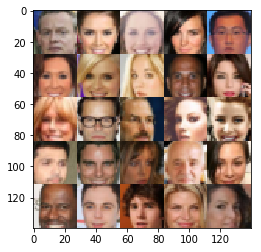

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real   = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='inputs_real') 
    inputs_z      = tf.placeholder(tf.float32, (None, z_dim), name='inputs_z') 
    learning_rate = tf.placeholder(tf.float32, name='learning_rate') 
    
    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/opt/conda/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/opt/conda/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/opt/conda/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 478, in start\n    self.io_loop.start()', 'File "/opt/conda/lib/python3.6/site-packages/zmq/eventloop/ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'File "/opt/co

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse = reuse):
        alpha = 0.2

        conv1 = tf.layers.conv2d(images, 32, 5, 2, 'SAME')
        relu1 = tf.maximum(alpha * conv1, conv1)
            
        conv2 = tf.layers.conv2d(relu1, 64, 5, 2, 'SAME')
        batch_norm2 = tf.layers.batch_normalization(conv2, training=True)
        relu2 = tf.maximum(alpha * batch_norm2, batch_norm2)
        
        drop = tf.layers.dropout(relu2, rate=0.1)
        conv3 = tf.layers.conv2d(drop, 128, 5, 1, 'SAME')
        batch_norm3 = tf.layers.batch_normalization(conv3, training=True)
        
        relu3 = tf.maximum(alpha * batch_norm3, batch_norm3)
        
        features = tf.reduce_mean(relu3,(1,2))  
        
        logits = tf.layers.dense(features, 1)
        
        out = tf.sigmoid(logits)
        

    return logits, out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('generator', reuse=False if is_train==True else True):
        x1 = tf.layers.dense(z, 7 * 7 * 512)
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training = is_train)
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 3, strides=1, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training = is_train)
        x2 = tf.maximum(alpha * x2, x2)
        x2 = tf.layers.dropout(x2, rate=0.5)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 3, strides=1, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.batch_normalization(x3, training = is_train)
        x3 = tf.maximum(alpha * x3, x3)
        x3 = tf.layers.dropout(x3, rate=0.5)
        
        x4 = tf.layers.conv2d_transpose(x3, 64, 3, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x4 = tf.layers.batch_normalization(x4, training = is_train)
        x4 = tf.maximum(alpha * x4, x4)
        
        logits = tf.layers.conv2d_transpose(x4, out_channel_dim, 3, strides=2, padding='same')
        
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                                              labels=tf.ones_like(d_logits_real) * 0.9))
    
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                              labels=tf.zeros_like(d_logits_real)))
    d_loss = d_loss_real + d_loss_fake

    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                         labels=tf.ones_like(d_logits_fake)))
    
    return d_loss, g_loss 


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    
    ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    g_updates = [opt for opt in ops if opt.name.startswith('generator')]
    with tf.control_dependencies(g_updates):
        g_train_opt = tf.train.AdamOptimizer(
            learning_rate, beta1).minimize(g_loss, var_list=g_vars)
        
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    #tf.reset_default_graph()
    input_real, input_z, _ = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                batch_images *= 2
                steps += 1
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z})
                
                if steps % 10 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                
                if steps % 100 == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/5... Discriminator Loss: 1.4799... Generator Loss: 0.4962
Epoch 1/5... Discriminator Loss: 1.4701... Generator Loss: 0.5015
Epoch 1/5... Discriminator Loss: 1.4621... Generator Loss: 0.5066
Epoch 1/5... Discriminator Loss: 1.4542... Generator Loss: 0.5118
Epoch 1/5... Discriminator Loss: 1.4475... Generator Loss: 0.5185
Epoch 1/5... Discriminator Loss: 1.4400... Generator Loss: 0.5258
Epoch 1/5... Discriminator Loss: 1.4351... Generator Loss: 0.5290
Epoch 1/5... Discriminator Loss: 1.4302... Generator Loss: 0.5331
Epoch 1/5... Discriminator Loss: 1.4245... Generator Loss: 0.5393
Epoch 1/5... Discriminator Loss: 1.4191... Generator Loss: 0.5452


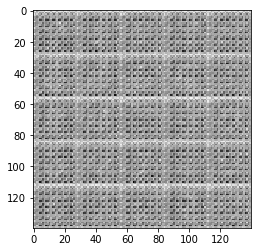

Epoch 1/5... Discriminator Loss: 1.4190... Generator Loss: 0.5478
Epoch 1/5... Discriminator Loss: 1.4116... Generator Loss: 0.5547
Epoch 1/5... Discriminator Loss: 1.4083... Generator Loss: 0.5602
Epoch 1/5... Discriminator Loss: 1.4061... Generator Loss: 0.5644
Epoch 1/5... Discriminator Loss: 1.3994... Generator Loss: 0.5717
Epoch 1/5... Discriminator Loss: 1.3937... Generator Loss: 0.5775
Epoch 1/5... Discriminator Loss: 1.3893... Generator Loss: 0.5794
Epoch 1/5... Discriminator Loss: 1.3857... Generator Loss: 0.5821
Epoch 1/5... Discriminator Loss: 1.3835... Generator Loss: 0.5884
Epoch 1/5... Discriminator Loss: 1.3842... Generator Loss: 0.5864


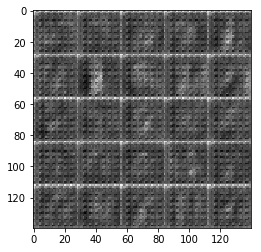

Epoch 1/5... Discriminator Loss: 1.3778... Generator Loss: 0.5939
Epoch 1/5... Discriminator Loss: 1.3785... Generator Loss: 0.6049
Epoch 1/5... Discriminator Loss: 1.3784... Generator Loss: 0.6078
Epoch 1/5... Discriminator Loss: 1.3778... Generator Loss: 0.6111
Epoch 1/5... Discriminator Loss: 1.3807... Generator Loss: 0.6077
Epoch 1/5... Discriminator Loss: 1.3790... Generator Loss: 0.6072
Epoch 1/5... Discriminator Loss: 1.3775... Generator Loss: 0.6065
Epoch 1/5... Discriminator Loss: 1.3767... Generator Loss: 0.6086
Epoch 1/5... Discriminator Loss: 1.3771... Generator Loss: 0.6183
Epoch 1/5... Discriminator Loss: 1.3774... Generator Loss: 0.6150


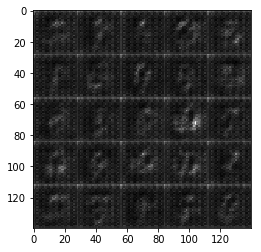

Epoch 1/5... Discriminator Loss: 1.3798... Generator Loss: 0.6211
Epoch 1/5... Discriminator Loss: 1.3800... Generator Loss: 0.6176
Epoch 1/5... Discriminator Loss: 1.3812... Generator Loss: 0.6084
Epoch 1/5... Discriminator Loss: 1.3863... Generator Loss: 0.6035
Epoch 1/5... Discriminator Loss: 1.3827... Generator Loss: 0.6222
Epoch 1/5... Discriminator Loss: 1.3858... Generator Loss: 0.6112
Epoch 1/5... Discriminator Loss: 1.3794... Generator Loss: 0.6289
Epoch 1/5... Discriminator Loss: 1.3833... Generator Loss: 0.6242
Epoch 1/5... Discriminator Loss: 1.3821... Generator Loss: 0.6159
Epoch 1/5... Discriminator Loss: 1.3841... Generator Loss: 0.6219


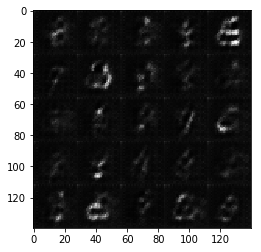

Epoch 1/5... Discriminator Loss: 1.3827... Generator Loss: 0.6239
Epoch 1/5... Discriminator Loss: 1.3850... Generator Loss: 0.6185
Epoch 1/5... Discriminator Loss: 1.3852... Generator Loss: 0.6189
Epoch 1/5... Discriminator Loss: 1.3837... Generator Loss: 0.6232
Epoch 1/5... Discriminator Loss: 1.3830... Generator Loss: 0.6251
Epoch 1/5... Discriminator Loss: 1.3817... Generator Loss: 0.6230
Epoch 1/5... Discriminator Loss: 1.3836... Generator Loss: 0.6345
Epoch 1/5... Discriminator Loss: 1.3854... Generator Loss: 0.6387
Epoch 1/5... Discriminator Loss: 1.3875... Generator Loss: 0.6251
Epoch 1/5... Discriminator Loss: 1.3841... Generator Loss: 0.6381


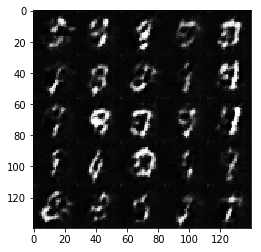

Epoch 1/5... Discriminator Loss: 1.3883... Generator Loss: 0.6250
Epoch 1/5... Discriminator Loss: 1.3856... Generator Loss: 0.6339
Epoch 1/5... Discriminator Loss: 1.3801... Generator Loss: 0.6333
Epoch 1/5... Discriminator Loss: 1.3843... Generator Loss: 0.6411
Epoch 1/5... Discriminator Loss: 1.3864... Generator Loss: 0.6438
Epoch 1/5... Discriminator Loss: 1.3875... Generator Loss: 0.6258
Epoch 1/5... Discriminator Loss: 1.3856... Generator Loss: 0.6355
Epoch 1/5... Discriminator Loss: 1.3891... Generator Loss: 0.6361
Epoch 1/5... Discriminator Loss: 1.3865... Generator Loss: 0.6481
Epoch 1/5... Discriminator Loss: 1.3843... Generator Loss: 0.6379


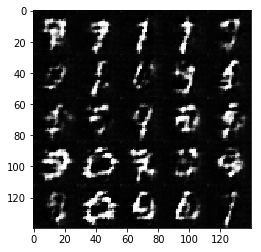

Epoch 1/5... Discriminator Loss: 1.3860... Generator Loss: 0.6463
Epoch 1/5... Discriminator Loss: 1.3862... Generator Loss: 0.6429
Epoch 1/5... Discriminator Loss: 1.3875... Generator Loss: 0.6497
Epoch 1/5... Discriminator Loss: 1.3894... Generator Loss: 0.6457
Epoch 1/5... Discriminator Loss: 1.3862... Generator Loss: 0.6402
Epoch 1/5... Discriminator Loss: 1.3866... Generator Loss: 0.6349
Epoch 1/5... Discriminator Loss: 1.3878... Generator Loss: 0.6513
Epoch 1/5... Discriminator Loss: 1.3909... Generator Loss: 0.6371
Epoch 1/5... Discriminator Loss: 1.3950... Generator Loss: 0.6295
Epoch 1/5... Discriminator Loss: 1.3882... Generator Loss: 0.6371


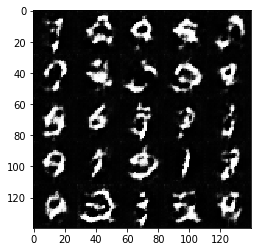

Epoch 1/5... Discriminator Loss: 1.3899... Generator Loss: 0.6336
Epoch 1/5... Discriminator Loss: 1.3858... Generator Loss: 0.6431
Epoch 1/5... Discriminator Loss: 1.3943... Generator Loss: 0.6230
Epoch 1/5... Discriminator Loss: 1.3921... Generator Loss: 0.6332
Epoch 1/5... Discriminator Loss: 1.3909... Generator Loss: 0.6432
Epoch 1/5... Discriminator Loss: 1.3895... Generator Loss: 0.6414
Epoch 1/5... Discriminator Loss: 1.3915... Generator Loss: 0.6374
Epoch 1/5... Discriminator Loss: 1.3909... Generator Loss: 0.6490
Epoch 1/5... Discriminator Loss: 1.3870... Generator Loss: 0.6555
Epoch 1/5... Discriminator Loss: 1.3936... Generator Loss: 0.6300


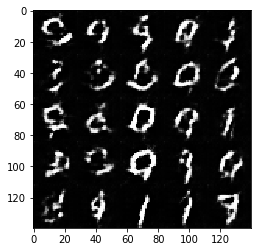

Epoch 1/5... Discriminator Loss: 1.3877... Generator Loss: 0.6475
Epoch 1/5... Discriminator Loss: 1.3900... Generator Loss: 0.6480
Epoch 1/5... Discriminator Loss: 1.3894... Generator Loss: 0.6541
Epoch 1/5... Discriminator Loss: 1.3927... Generator Loss: 0.6484
Epoch 1/5... Discriminator Loss: 1.3881... Generator Loss: 0.6504
Epoch 1/5... Discriminator Loss: 1.3877... Generator Loss: 0.6457
Epoch 1/5... Discriminator Loss: 1.3908... Generator Loss: 0.6348
Epoch 1/5... Discriminator Loss: 1.3926... Generator Loss: 0.6405
Epoch 1/5... Discriminator Loss: 1.4013... Generator Loss: 0.6358
Epoch 1/5... Discriminator Loss: 1.3883... Generator Loss: 0.6495


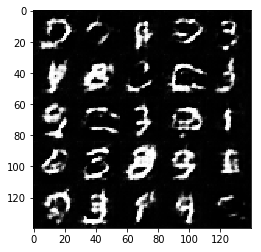

Epoch 1/5... Discriminator Loss: 1.3916... Generator Loss: 0.6564
Epoch 1/5... Discriminator Loss: 1.3884... Generator Loss: 0.6486
Epoch 1/5... Discriminator Loss: 1.3958... Generator Loss: 0.6474
Epoch 2/5... Discriminator Loss: 1.3836... Generator Loss: 0.6528
Epoch 2/5... Discriminator Loss: 1.3938... Generator Loss: 0.6499
Epoch 2/5... Discriminator Loss: 1.3935... Generator Loss: 0.6428
Epoch 2/5... Discriminator Loss: 1.3951... Generator Loss: 0.6406
Epoch 2/5... Discriminator Loss: 1.3909... Generator Loss: 0.6480
Epoch 2/5... Discriminator Loss: 1.3938... Generator Loss: 0.6380
Epoch 2/5... Discriminator Loss: 1.3974... Generator Loss: 0.6418


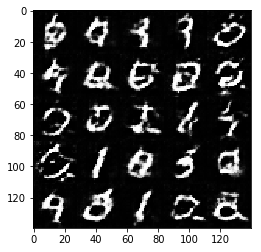

Epoch 2/5... Discriminator Loss: 1.3880... Generator Loss: 0.6498
Epoch 2/5... Discriminator Loss: 1.3920... Generator Loss: 0.6449
Epoch 2/5... Discriminator Loss: 1.3894... Generator Loss: 0.6489
Epoch 2/5... Discriminator Loss: 1.3906... Generator Loss: 0.6592
Epoch 2/5... Discriminator Loss: 1.3911... Generator Loss: 0.6500
Epoch 2/5... Discriminator Loss: 1.3940... Generator Loss: 0.6504
Epoch 2/5... Discriminator Loss: 1.3911... Generator Loss: 0.6535
Epoch 2/5... Discriminator Loss: 1.4004... Generator Loss: 0.6442
Epoch 2/5... Discriminator Loss: 1.3919... Generator Loss: 0.6494
Epoch 2/5... Discriminator Loss: 1.3857... Generator Loss: 0.6587


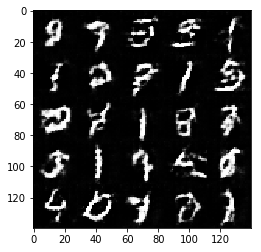

Epoch 2/5... Discriminator Loss: 1.3898... Generator Loss: 0.6535
Epoch 2/5... Discriminator Loss: 1.3913... Generator Loss: 0.6565
Epoch 2/5... Discriminator Loss: 1.3893... Generator Loss: 0.6587
Epoch 2/5... Discriminator Loss: 1.3920... Generator Loss: 0.6496
Epoch 2/5... Discriminator Loss: 1.3914... Generator Loss: 0.6502
Epoch 2/5... Discriminator Loss: 1.3879... Generator Loss: 0.6605
Epoch 2/5... Discriminator Loss: 1.3988... Generator Loss: 0.6334
Epoch 2/5... Discriminator Loss: 1.3896... Generator Loss: 0.6518
Epoch 2/5... Discriminator Loss: 1.3930... Generator Loss: 0.6576
Epoch 2/5... Discriminator Loss: 1.3906... Generator Loss: 0.6586


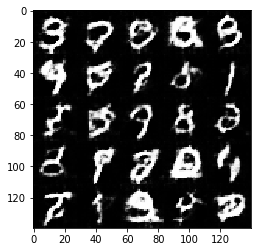

Epoch 2/5... Discriminator Loss: 1.3892... Generator Loss: 0.6628
Epoch 2/5... Discriminator Loss: 1.3903... Generator Loss: 0.6554
Epoch 2/5... Discriminator Loss: 1.3873... Generator Loss: 0.6631
Epoch 2/5... Discriminator Loss: 1.3910... Generator Loss: 0.6612
Epoch 2/5... Discriminator Loss: 1.3897... Generator Loss: 0.6575
Epoch 2/5... Discriminator Loss: 1.3972... Generator Loss: 0.6490
Epoch 2/5... Discriminator Loss: 1.3960... Generator Loss: 0.6548
Epoch 2/5... Discriminator Loss: 1.3929... Generator Loss: 0.6625
Epoch 2/5... Discriminator Loss: 1.3949... Generator Loss: 0.6542
Epoch 2/5... Discriminator Loss: 1.3895... Generator Loss: 0.6642


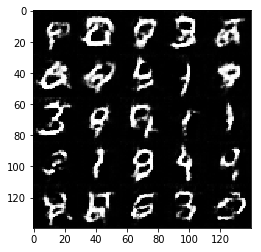

Epoch 2/5... Discriminator Loss: 1.3884... Generator Loss: 0.6610
Epoch 2/5... Discriminator Loss: 1.3883... Generator Loss: 0.6655
Epoch 2/5... Discriminator Loss: 1.3893... Generator Loss: 0.6697
Epoch 2/5... Discriminator Loss: 1.3917... Generator Loss: 0.6611
Epoch 2/5... Discriminator Loss: 1.3863... Generator Loss: 0.6632
Epoch 2/5... Discriminator Loss: 1.3892... Generator Loss: 0.6614
Epoch 2/5... Discriminator Loss: 1.3903... Generator Loss: 0.6601
Epoch 2/5... Discriminator Loss: 1.3933... Generator Loss: 0.6584
Epoch 2/5... Discriminator Loss: 1.3882... Generator Loss: 0.6639
Epoch 2/5... Discriminator Loss: 1.3906... Generator Loss: 0.6693


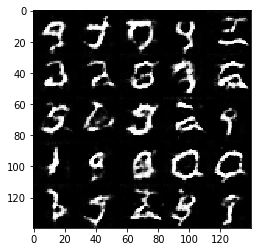

Epoch 2/5... Discriminator Loss: 1.3883... Generator Loss: 0.6633
Epoch 2/5... Discriminator Loss: 1.3930... Generator Loss: 0.6563
Epoch 2/5... Discriminator Loss: 1.3899... Generator Loss: 0.6578
Epoch 2/5... Discriminator Loss: 1.3923... Generator Loss: 0.6629
Epoch 2/5... Discriminator Loss: 1.3907... Generator Loss: 0.6665
Epoch 2/5... Discriminator Loss: 1.3936... Generator Loss: 0.6544
Epoch 2/5... Discriminator Loss: 1.3878... Generator Loss: 0.6731
Epoch 2/5... Discriminator Loss: 1.3889... Generator Loss: 0.6587
Epoch 2/5... Discriminator Loss: 1.3907... Generator Loss: 0.6654
Epoch 2/5... Discriminator Loss: 1.3872... Generator Loss: 0.6705


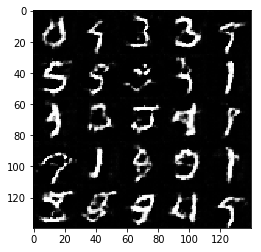

Epoch 2/5... Discriminator Loss: 1.3896... Generator Loss: 0.6663
Epoch 2/5... Discriminator Loss: 1.3904... Generator Loss: 0.6650
Epoch 2/5... Discriminator Loss: 1.3872... Generator Loss: 0.6743
Epoch 2/5... Discriminator Loss: 1.3933... Generator Loss: 0.6652
Epoch 2/5... Discriminator Loss: 1.3884... Generator Loss: 0.6663
Epoch 2/5... Discriminator Loss: 1.3896... Generator Loss: 0.6694
Epoch 2/5... Discriminator Loss: 1.3895... Generator Loss: 0.6692
Epoch 2/5... Discriminator Loss: 1.3892... Generator Loss: 0.6657
Epoch 2/5... Discriminator Loss: 1.3906... Generator Loss: 0.6685
Epoch 2/5... Discriminator Loss: 1.3881... Generator Loss: 0.6705


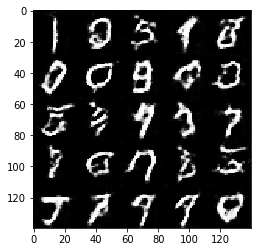

Epoch 2/5... Discriminator Loss: 1.3874... Generator Loss: 0.6743
Epoch 2/5... Discriminator Loss: 1.3901... Generator Loss: 0.6726
Epoch 2/5... Discriminator Loss: 1.3915... Generator Loss: 0.6686
Epoch 2/5... Discriminator Loss: 1.3885... Generator Loss: 0.6766
Epoch 2/5... Discriminator Loss: 1.3884... Generator Loss: 0.6781
Epoch 2/5... Discriminator Loss: 1.3908... Generator Loss: 0.6691
Epoch 2/5... Discriminator Loss: 1.3909... Generator Loss: 0.6704
Epoch 2/5... Discriminator Loss: 1.3895... Generator Loss: 0.6718
Epoch 2/5... Discriminator Loss: 1.3904... Generator Loss: 0.6625
Epoch 2/5... Discriminator Loss: 1.3890... Generator Loss: 0.6768


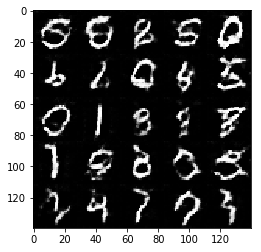

Epoch 2/5... Discriminator Loss: 1.3888... Generator Loss: 0.6753
Epoch 2/5... Discriminator Loss: 1.3901... Generator Loss: 0.6741
Epoch 2/5... Discriminator Loss: 1.3928... Generator Loss: 0.6616
Epoch 2/5... Discriminator Loss: 1.3887... Generator Loss: 0.6667
Epoch 2/5... Discriminator Loss: 1.3891... Generator Loss: 0.6695
Epoch 2/5... Discriminator Loss: 1.3888... Generator Loss: 0.6748
Epoch 2/5... Discriminator Loss: 1.3889... Generator Loss: 0.6776
Epoch 2/5... Discriminator Loss: 1.3888... Generator Loss: 0.6775
Epoch 2/5... Discriminator Loss: 1.3901... Generator Loss: 0.6707
Epoch 2/5... Discriminator Loss: 1.3887... Generator Loss: 0.6745


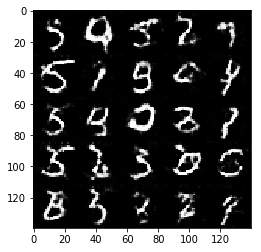

Epoch 2/5... Discriminator Loss: 1.3874... Generator Loss: 0.6799
Epoch 2/5... Discriminator Loss: 1.3880... Generator Loss: 0.6748
Epoch 2/5... Discriminator Loss: 1.3919... Generator Loss: 0.6670
Epoch 2/5... Discriminator Loss: 1.3893... Generator Loss: 0.6728
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6745
Epoch 2/5... Discriminator Loss: 1.3869... Generator Loss: 0.6788
Epoch 2/5... Discriminator Loss: 1.3899... Generator Loss: 0.6759
Epoch 3/5... Discriminator Loss: 1.3882... Generator Loss: 0.6748
Epoch 3/5... Discriminator Loss: 1.3890... Generator Loss: 0.6795
Epoch 3/5... Discriminator Loss: 1.3881... Generator Loss: 0.6771


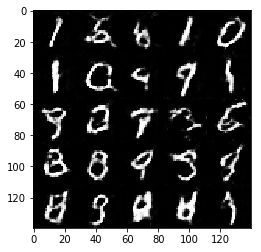

Epoch 3/5... Discriminator Loss: 1.3889... Generator Loss: 0.6715
Epoch 3/5... Discriminator Loss: 1.3881... Generator Loss: 0.6789
Epoch 3/5... Discriminator Loss: 1.3882... Generator Loss: 0.6722
Epoch 3/5... Discriminator Loss: 1.3892... Generator Loss: 0.6711
Epoch 3/5... Discriminator Loss: 1.3927... Generator Loss: 0.6713
Epoch 3/5... Discriminator Loss: 1.3869... Generator Loss: 0.6720
Epoch 3/5... Discriminator Loss: 1.3917... Generator Loss: 0.6718
Epoch 3/5... Discriminator Loss: 1.3887... Generator Loss: 0.6785
Epoch 3/5... Discriminator Loss: 1.3893... Generator Loss: 0.6780
Epoch 3/5... Discriminator Loss: 1.3878... Generator Loss: 0.6745


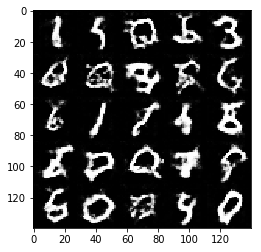

Epoch 3/5... Discriminator Loss: 1.3916... Generator Loss: 0.6733
Epoch 3/5... Discriminator Loss: 1.3915... Generator Loss: 0.6742
Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6799
Epoch 3/5... Discriminator Loss: 1.3903... Generator Loss: 0.6747
Epoch 3/5... Discriminator Loss: 1.3899... Generator Loss: 0.6746
Epoch 3/5... Discriminator Loss: 1.3881... Generator Loss: 0.6779
Epoch 3/5... Discriminator Loss: 1.3902... Generator Loss: 0.6763
Epoch 3/5... Discriminator Loss: 1.3873... Generator Loss: 0.6760
Epoch 3/5... Discriminator Loss: 1.3880... Generator Loss: 0.6749
Epoch 3/5... Discriminator Loss: 1.3897... Generator Loss: 0.6766


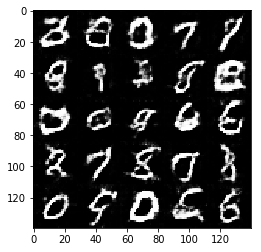

Epoch 3/5... Discriminator Loss: 1.3879... Generator Loss: 0.6808
Epoch 3/5... Discriminator Loss: 1.3916... Generator Loss: 0.6741
Epoch 3/5... Discriminator Loss: 1.3868... Generator Loss: 0.6831
Epoch 3/5... Discriminator Loss: 1.3894... Generator Loss: 0.6730
Epoch 3/5... Discriminator Loss: 1.3994... Generator Loss: 0.6592
Epoch 3/5... Discriminator Loss: 1.3875... Generator Loss: 0.6800
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6828
Epoch 3/5... Discriminator Loss: 1.3877... Generator Loss: 0.6817
Epoch 3/5... Discriminator Loss: 1.3907... Generator Loss: 0.6793
Epoch 3/5... Discriminator Loss: 1.3890... Generator Loss: 0.6767


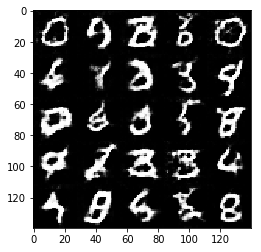

Epoch 3/5... Discriminator Loss: 1.3883... Generator Loss: 0.6823
Epoch 3/5... Discriminator Loss: 1.3872... Generator Loss: 0.6796
Epoch 3/5... Discriminator Loss: 1.3873... Generator Loss: 0.6810
Epoch 3/5... Discriminator Loss: 1.3901... Generator Loss: 0.6741
Epoch 3/5... Discriminator Loss: 1.3878... Generator Loss: 0.6819
Epoch 3/5... Discriminator Loss: 1.3878... Generator Loss: 0.6819
Epoch 3/5... Discriminator Loss: 1.3856... Generator Loss: 0.6803
Epoch 3/5... Discriminator Loss: 1.3890... Generator Loss: 0.6766
Epoch 3/5... Discriminator Loss: 1.3875... Generator Loss: 0.6785
Epoch 3/5... Discriminator Loss: 1.3871... Generator Loss: 0.6836


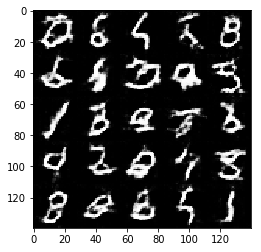

Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6833
Epoch 3/5... Discriminator Loss: 1.3912... Generator Loss: 0.6769
Epoch 3/5... Discriminator Loss: 1.3876... Generator Loss: 0.6817
Epoch 3/5... Discriminator Loss: 1.3883... Generator Loss: 0.6830
Epoch 3/5... Discriminator Loss: 1.3898... Generator Loss: 0.6779
Epoch 3/5... Discriminator Loss: 1.3881... Generator Loss: 0.6793
Epoch 3/5... Discriminator Loss: 1.3870... Generator Loss: 0.6838
Epoch 3/5... Discriminator Loss: 1.3873... Generator Loss: 0.6782
Epoch 3/5... Discriminator Loss: 1.3880... Generator Loss: 0.6783
Epoch 3/5... Discriminator Loss: 1.3888... Generator Loss: 0.6778


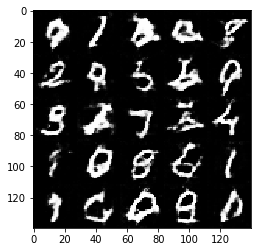

Epoch 3/5... Discriminator Loss: 1.3909... Generator Loss: 0.6765
Epoch 3/5... Discriminator Loss: 1.3859... Generator Loss: 0.6814
Epoch 3/5... Discriminator Loss: 1.3880... Generator Loss: 0.6822
Epoch 3/5... Discriminator Loss: 1.3867... Generator Loss: 0.6849
Epoch 3/5... Discriminator Loss: 1.3897... Generator Loss: 0.6749
Epoch 3/5... Discriminator Loss: 1.3905... Generator Loss: 0.6770
Epoch 3/5... Discriminator Loss: 1.3882... Generator Loss: 0.6778
Epoch 3/5... Discriminator Loss: 1.3872... Generator Loss: 0.6798
Epoch 3/5... Discriminator Loss: 1.3908... Generator Loss: 0.6793
Epoch 3/5... Discriminator Loss: 1.3886... Generator Loss: 0.6832


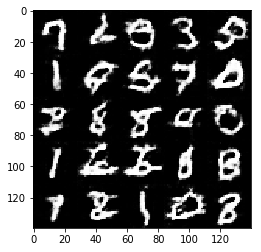

Epoch 3/5... Discriminator Loss: 1.3880... Generator Loss: 0.6810
Epoch 3/5... Discriminator Loss: 1.3867... Generator Loss: 0.6836
Epoch 3/5... Discriminator Loss: 1.3875... Generator Loss: 0.6828
Epoch 3/5... Discriminator Loss: 1.3890... Generator Loss: 0.6763
Epoch 3/5... Discriminator Loss: 1.3899... Generator Loss: 0.6798
Epoch 3/5... Discriminator Loss: 1.3908... Generator Loss: 0.6788
Epoch 3/5... Discriminator Loss: 1.3876... Generator Loss: 0.6859
Epoch 3/5... Discriminator Loss: 1.3889... Generator Loss: 0.6773
Epoch 3/5... Discriminator Loss: 1.3881... Generator Loss: 0.6817
Epoch 3/5... Discriminator Loss: 1.3874... Generator Loss: 0.6803


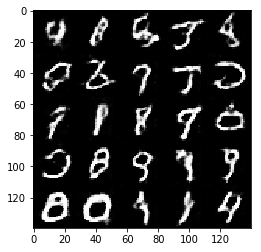

Epoch 3/5... Discriminator Loss: 1.3866... Generator Loss: 0.6844
Epoch 3/5... Discriminator Loss: 1.3880... Generator Loss: 0.6853
Epoch 3/5... Discriminator Loss: 1.3871... Generator Loss: 0.6839
Epoch 3/5... Discriminator Loss: 1.3867... Generator Loss: 0.6850
Epoch 3/5... Discriminator Loss: 1.3877... Generator Loss: 0.6833
Epoch 3/5... Discriminator Loss: 1.3877... Generator Loss: 0.6798
Epoch 3/5... Discriminator Loss: 1.3872... Generator Loss: 0.6860
Epoch 3/5... Discriminator Loss: 1.3856... Generator Loss: 0.6791
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6848
Epoch 3/5... Discriminator Loss: 1.3878... Generator Loss: 0.6818


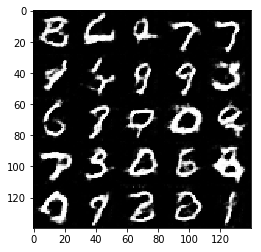

Epoch 3/5... Discriminator Loss: 1.3859... Generator Loss: 0.6856
Epoch 3/5... Discriminator Loss: 1.3874... Generator Loss: 0.6850
Epoch 3/5... Discriminator Loss: 1.3877... Generator Loss: 0.6828
Epoch 3/5... Discriminator Loss: 1.3870... Generator Loss: 0.6849
Epoch 3/5... Discriminator Loss: 1.3879... Generator Loss: 0.6834
Epoch 3/5... Discriminator Loss: 1.3860... Generator Loss: 0.6860
Epoch 3/5... Discriminator Loss: 1.3901... Generator Loss: 0.6820
Epoch 3/5... Discriminator Loss: 1.3873... Generator Loss: 0.6866
Epoch 3/5... Discriminator Loss: 1.3878... Generator Loss: 0.6834
Epoch 3/5... Discriminator Loss: 1.3885... Generator Loss: 0.6827


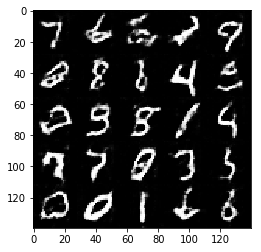

Epoch 3/5... Discriminator Loss: 1.3871... Generator Loss: 0.6844
Epoch 4/5... Discriminator Loss: 1.3867... Generator Loss: 0.6833
Epoch 4/5... Discriminator Loss: 1.3873... Generator Loss: 0.6844
Epoch 4/5... Discriminator Loss: 1.3864... Generator Loss: 0.6872
Epoch 4/5... Discriminator Loss: 1.3870... Generator Loss: 0.6836
Epoch 4/5... Discriminator Loss: 1.3875... Generator Loss: 0.6830
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6870
Epoch 4/5... Discriminator Loss: 1.3879... Generator Loss: 0.6821
Epoch 4/5... Discriminator Loss: 1.3883... Generator Loss: 0.6814
Epoch 4/5... Discriminator Loss: 1.3902... Generator Loss: 0.6782


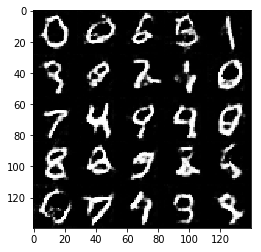

Epoch 4/5... Discriminator Loss: 1.3877... Generator Loss: 0.6858
Epoch 4/5... Discriminator Loss: 1.3866... Generator Loss: 0.6859
Epoch 4/5... Discriminator Loss: 1.3871... Generator Loss: 0.6860
Epoch 4/5... Discriminator Loss: 1.3868... Generator Loss: 0.6860
Epoch 4/5... Discriminator Loss: 1.3886... Generator Loss: 0.6781
Epoch 4/5... Discriminator Loss: 1.3873... Generator Loss: 0.6846
Epoch 4/5... Discriminator Loss: 1.3870... Generator Loss: 0.6791
Epoch 4/5... Discriminator Loss: 1.3871... Generator Loss: 0.6854
Epoch 4/5... Discriminator Loss: 1.3883... Generator Loss: 0.6835
Epoch 4/5... Discriminator Loss: 1.3909... Generator Loss: 0.6736


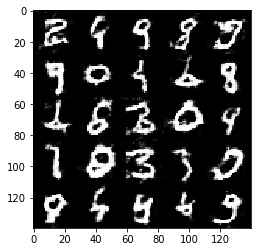

Epoch 4/5... Discriminator Loss: 1.3865... Generator Loss: 0.6865
Epoch 4/5... Discriminator Loss: 1.3874... Generator Loss: 0.6838
Epoch 4/5... Discriminator Loss: 1.3880... Generator Loss: 0.6852
Epoch 4/5... Discriminator Loss: 1.3880... Generator Loss: 0.6799
Epoch 4/5... Discriminator Loss: 1.3869... Generator Loss: 0.6878
Epoch 4/5... Discriminator Loss: 1.3875... Generator Loss: 0.6875
Epoch 4/5... Discriminator Loss: 1.3871... Generator Loss: 0.6881
Epoch 4/5... Discriminator Loss: 1.3850... Generator Loss: 0.6836
Epoch 4/5... Discriminator Loss: 1.3874... Generator Loss: 0.6859
Epoch 4/5... Discriminator Loss: 1.3870... Generator Loss: 0.6867


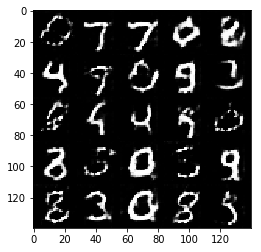

Epoch 4/5... Discriminator Loss: 1.3874... Generator Loss: 0.6847
Epoch 4/5... Discriminator Loss: 1.3869... Generator Loss: 0.6851
Epoch 4/5... Discriminator Loss: 1.3888... Generator Loss: 0.6810
Epoch 4/5... Discriminator Loss: 1.3879... Generator Loss: 0.6853
Epoch 4/5... Discriminator Loss: 1.3868... Generator Loss: 0.6825
Epoch 4/5... Discriminator Loss: 1.3900... Generator Loss: 0.6814
Epoch 4/5... Discriminator Loss: 1.3868... Generator Loss: 0.6867
Epoch 4/5... Discriminator Loss: 1.3864... Generator Loss: 0.6883
Epoch 4/5... Discriminator Loss: 1.3878... Generator Loss: 0.6866
Epoch 4/5... Discriminator Loss: 1.3892... Generator Loss: 0.6740


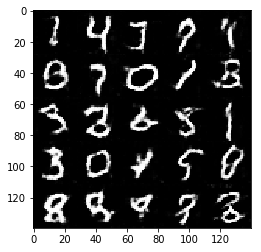

Epoch 4/5... Discriminator Loss: 1.3868... Generator Loss: 0.6880
Epoch 4/5... Discriminator Loss: 1.3864... Generator Loss: 0.6865
Epoch 4/5... Discriminator Loss: 1.3870... Generator Loss: 0.6874
Epoch 4/5... Discriminator Loss: 1.3872... Generator Loss: 0.6859
Epoch 4/5... Discriminator Loss: 1.3864... Generator Loss: 0.6869
Epoch 4/5... Discriminator Loss: 1.3884... Generator Loss: 0.6861
Epoch 4/5... Discriminator Loss: 1.3869... Generator Loss: 0.6842
Epoch 4/5... Discriminator Loss: 1.3871... Generator Loss: 0.6884
Epoch 4/5... Discriminator Loss: 1.3868... Generator Loss: 0.6881
Epoch 4/5... Discriminator Loss: 1.3871... Generator Loss: 0.6866


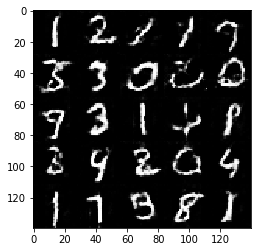

Epoch 4/5... Discriminator Loss: 1.3867... Generator Loss: 0.6880
Epoch 4/5... Discriminator Loss: 1.3872... Generator Loss: 0.6868
Epoch 4/5... Discriminator Loss: 1.3872... Generator Loss: 0.6869
Epoch 4/5... Discriminator Loss: 1.3873... Generator Loss: 0.6874
Epoch 4/5... Discriminator Loss: 1.3862... Generator Loss: 0.6868
Epoch 4/5... Discriminator Loss: 1.3877... Generator Loss: 0.6852
Epoch 4/5... Discriminator Loss: 1.3874... Generator Loss: 0.6858
Epoch 4/5... Discriminator Loss: 1.3871... Generator Loss: 0.6872
Epoch 4/5... Discriminator Loss: 1.3879... Generator Loss: 0.6873
Epoch 4/5... Discriminator Loss: 1.3895... Generator Loss: 0.6802


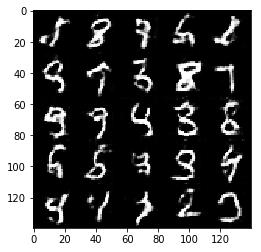

Epoch 4/5... Discriminator Loss: 1.3888... Generator Loss: 0.6856
Epoch 4/5... Discriminator Loss: 1.3870... Generator Loss: 0.6865
Epoch 4/5... Discriminator Loss: 1.3870... Generator Loss: 0.6878
Epoch 4/5... Discriminator Loss: 1.3864... Generator Loss: 0.6885
Epoch 4/5... Discriminator Loss: 1.3870... Generator Loss: 0.6884
Epoch 4/5... Discriminator Loss: 1.3870... Generator Loss: 0.6879
Epoch 4/5... Discriminator Loss: 1.3872... Generator Loss: 0.6885
Epoch 4/5... Discriminator Loss: 1.3937... Generator Loss: 0.6748
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6880
Epoch 4/5... Discriminator Loss: 1.3869... Generator Loss: 0.6884


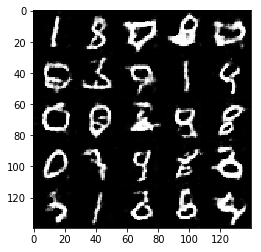

Epoch 4/5... Discriminator Loss: 1.3871... Generator Loss: 0.6877
Epoch 4/5... Discriminator Loss: 1.3876... Generator Loss: 0.6858
Epoch 4/5... Discriminator Loss: 1.3887... Generator Loss: 0.6790
Epoch 4/5... Discriminator Loss: 1.3869... Generator Loss: 0.6895
Epoch 4/5... Discriminator Loss: 1.3874... Generator Loss: 0.6883
Epoch 4/5... Discriminator Loss: 1.3868... Generator Loss: 0.6885
Epoch 4/5... Discriminator Loss: 1.3870... Generator Loss: 0.6868
Epoch 4/5... Discriminator Loss: 1.3870... Generator Loss: 0.6876
Epoch 4/5... Discriminator Loss: 1.3864... Generator Loss: 0.6867
Epoch 4/5... Discriminator Loss: 1.3867... Generator Loss: 0.6882


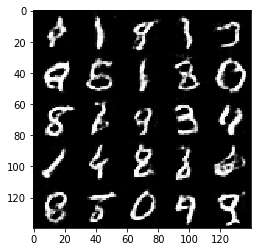

Epoch 4/5... Discriminator Loss: 1.3864... Generator Loss: 0.6890
Epoch 4/5... Discriminator Loss: 1.3875... Generator Loss: 0.6851
Epoch 4/5... Discriminator Loss: 1.3869... Generator Loss: 0.6875
Epoch 4/5... Discriminator Loss: 1.3874... Generator Loss: 0.6864
Epoch 4/5... Discriminator Loss: 1.3874... Generator Loss: 0.6875
Epoch 4/5... Discriminator Loss: 1.3865... Generator Loss: 0.6891
Epoch 4/5... Discriminator Loss: 1.3872... Generator Loss: 0.6874
Epoch 4/5... Discriminator Loss: 1.3877... Generator Loss: 0.6878
Epoch 4/5... Discriminator Loss: 1.3875... Generator Loss: 0.6845
Epoch 4/5... Discriminator Loss: 1.3879... Generator Loss: 0.6861


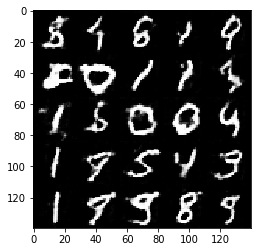

Epoch 4/5... Discriminator Loss: 1.3869... Generator Loss: 0.6885
Epoch 4/5... Discriminator Loss: 1.3868... Generator Loss: 0.6869
Epoch 4/5... Discriminator Loss: 1.3878... Generator Loss: 0.6833
Epoch 4/5... Discriminator Loss: 1.3865... Generator Loss: 0.6890
Epoch 5/5... Discriminator Loss: 1.3865... Generator Loss: 0.6902
Epoch 5/5... Discriminator Loss: 1.3865... Generator Loss: 0.6897
Epoch 5/5... Discriminator Loss: 1.3871... Generator Loss: 0.6872
Epoch 5/5... Discriminator Loss: 1.3868... Generator Loss: 0.6896
Epoch 5/5... Discriminator Loss: 1.3867... Generator Loss: 0.6884
Epoch 5/5... Discriminator Loss: 1.3865... Generator Loss: 0.6875


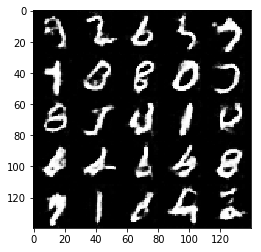

Epoch 5/5... Discriminator Loss: 1.3868... Generator Loss: 0.6885
Epoch 5/5... Discriminator Loss: 1.3873... Generator Loss: 0.6892
Epoch 5/5... Discriminator Loss: 1.3864... Generator Loss: 0.6889
Epoch 5/5... Discriminator Loss: 1.3867... Generator Loss: 0.6902
Epoch 5/5... Discriminator Loss: 1.3866... Generator Loss: 0.6898
Epoch 5/5... Discriminator Loss: 1.3866... Generator Loss: 0.6889
Epoch 5/5... Discriminator Loss: 1.3868... Generator Loss: 0.6894
Epoch 5/5... Discriminator Loss: 1.3867... Generator Loss: 0.6895
Epoch 5/5... Discriminator Loss: 1.3866... Generator Loss: 0.6889
Epoch 5/5... Discriminator Loss: 1.3865... Generator Loss: 0.6892


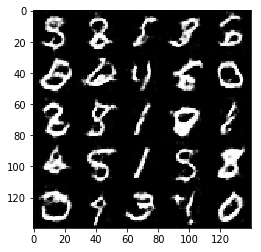

Epoch 5/5... Discriminator Loss: 1.3868... Generator Loss: 0.6889
Epoch 5/5... Discriminator Loss: 1.3872... Generator Loss: 0.6887
Epoch 5/5... Discriminator Loss: 1.3872... Generator Loss: 0.6877
Epoch 5/5... Discriminator Loss: 1.3877... Generator Loss: 0.6865
Epoch 5/5... Discriminator Loss: 1.3859... Generator Loss: 0.6879
Epoch 5/5... Discriminator Loss: 1.3871... Generator Loss: 0.6887
Epoch 5/5... Discriminator Loss: 1.3866... Generator Loss: 0.6865
Epoch 5/5... Discriminator Loss: 1.3862... Generator Loss: 0.6900
Epoch 5/5... Discriminator Loss: 1.3869... Generator Loss: 0.6901
Epoch 5/5... Discriminator Loss: 1.3866... Generator Loss: 0.6902


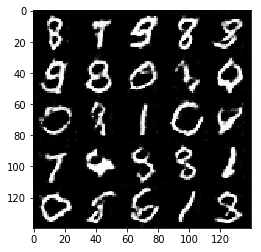

Epoch 5/5... Discriminator Loss: 1.3867... Generator Loss: 0.6899
Epoch 5/5... Discriminator Loss: 1.3869... Generator Loss: 0.6878
Epoch 5/5... Discriminator Loss: 1.3869... Generator Loss: 0.6888
Epoch 5/5... Discriminator Loss: 1.3865... Generator Loss: 0.6901
Epoch 5/5... Discriminator Loss: 1.3874... Generator Loss: 0.6899
Epoch 5/5... Discriminator Loss: 1.3864... Generator Loss: 0.6906
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6872
Epoch 5/5... Discriminator Loss: 1.3868... Generator Loss: 0.6894
Epoch 5/5... Discriminator Loss: 1.3869... Generator Loss: 0.6892
Epoch 5/5... Discriminator Loss: 1.3871... Generator Loss: 0.6893


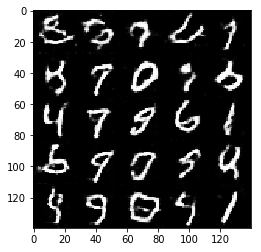

Epoch 5/5... Discriminator Loss: 1.3873... Generator Loss: 0.6880
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6892
Epoch 5/5... Discriminator Loss: 1.3867... Generator Loss: 0.6901
Epoch 5/5... Discriminator Loss: 1.3868... Generator Loss: 0.6897
Epoch 5/5... Discriminator Loss: 1.3866... Generator Loss: 0.6899
Epoch 5/5... Discriminator Loss: 1.3869... Generator Loss: 0.6900
Epoch 5/5... Discriminator Loss: 1.3875... Generator Loss: 0.6876
Epoch 5/5... Discriminator Loss: 1.3864... Generator Loss: 0.6902
Epoch 5/5... Discriminator Loss: 1.3865... Generator Loss: 0.6898
Epoch 5/5... Discriminator Loss: 1.3873... Generator Loss: 0.6893


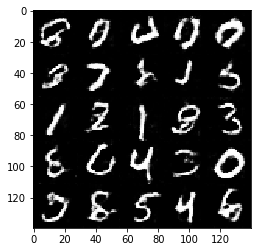

Epoch 5/5... Discriminator Loss: 1.3867... Generator Loss: 0.6900
Epoch 5/5... Discriminator Loss: 1.3866... Generator Loss: 0.6894
Epoch 5/5... Discriminator Loss: 1.3864... Generator Loss: 0.6903
Epoch 5/5... Discriminator Loss: 1.3865... Generator Loss: 0.6886
Epoch 5/5... Discriminator Loss: 1.3869... Generator Loss: 0.6900
Epoch 5/5... Discriminator Loss: 1.3860... Generator Loss: 0.6893
Epoch 5/5... Discriminator Loss: 1.3871... Generator Loss: 0.6892
Epoch 5/5... Discriminator Loss: 1.3869... Generator Loss: 0.6896
Epoch 5/5... Discriminator Loss: 1.3865... Generator Loss: 0.6901
Epoch 5/5... Discriminator Loss: 1.3867... Generator Loss: 0.6905


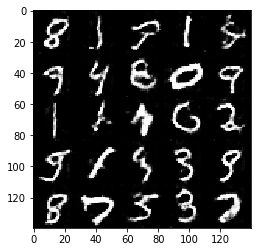

Epoch 5/5... Discriminator Loss: 1.3864... Generator Loss: 0.6905
Epoch 5/5... Discriminator Loss: 1.3868... Generator Loss: 0.6896
Epoch 5/5... Discriminator Loss: 1.3864... Generator Loss: 0.6904
Epoch 5/5... Discriminator Loss: 1.3867... Generator Loss: 0.6901
Epoch 5/5... Discriminator Loss: 1.3867... Generator Loss: 0.6895
Epoch 5/5... Discriminator Loss: 1.3867... Generator Loss: 0.6899
Epoch 5/5... Discriminator Loss: 1.3882... Generator Loss: 0.6886
Epoch 5/5... Discriminator Loss: 1.3866... Generator Loss: 0.6897
Epoch 5/5... Discriminator Loss: 1.3866... Generator Loss: 0.6908
Epoch 5/5... Discriminator Loss: 1.3865... Generator Loss: 0.6905


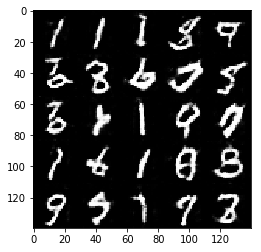

Epoch 5/5... Discriminator Loss: 1.3866... Generator Loss: 0.6899
Epoch 5/5... Discriminator Loss: 1.3868... Generator Loss: 0.6899
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6900
Epoch 5/5... Discriminator Loss: 1.3872... Generator Loss: 0.6897
Epoch 5/5... Discriminator Loss: 1.3867... Generator Loss: 0.6898
Epoch 5/5... Discriminator Loss: 1.3865... Generator Loss: 0.6902
Epoch 5/5... Discriminator Loss: 1.3866... Generator Loss: 0.6905
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6908
Epoch 5/5... Discriminator Loss: 1.3864... Generator Loss: 0.6907
Epoch 5/5... Discriminator Loss: 1.3866... Generator Loss: 0.6907


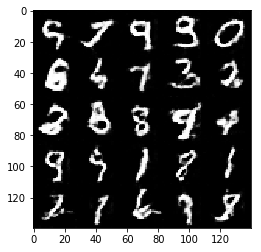

Epoch 5/5... Discriminator Loss: 1.3865... Generator Loss: 0.6906
Epoch 5/5... Discriminator Loss: 1.3864... Generator Loss: 0.6911
Epoch 5/5... Discriminator Loss: 1.3864... Generator Loss: 0.6912
Epoch 5/5... Discriminator Loss: 1.3867... Generator Loss: 0.6907
Epoch 5/5... Discriminator Loss: 1.3876... Generator Loss: 0.6878
Epoch 5/5... Discriminator Loss: 1.3862... Generator Loss: 0.6907
Epoch 5/5... Discriminator Loss: 1.3862... Generator Loss: 0.6909
Epoch 5/5... Discriminator Loss: 1.3870... Generator Loss: 0.6904
Epoch 5/5... Discriminator Loss: 1.3861... Generator Loss: 0.6898
Epoch 5/5... Discriminator Loss: 1.3877... Generator Loss: 0.6888


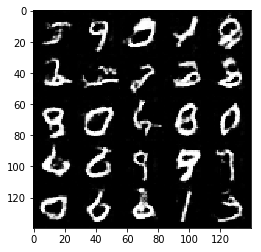

Epoch 5/5... Discriminator Loss: 1.3866... Generator Loss: 0.6899
Epoch 5/5... Discriminator Loss: 1.3871... Generator Loss: 0.6900
Epoch 5/5... Discriminator Loss: 1.3866... Generator Loss: 0.6888
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6910
Epoch 5/5... Discriminator Loss: 1.3866... Generator Loss: 0.6904
Epoch 5/5... Discriminator Loss: 1.3864... Generator Loss: 0.6904
Epoch 5/5... Discriminator Loss: 1.3871... Generator Loss: 0.6896
Epoch 5/5... Discriminator Loss: 1.3865... Generator Loss: 0.6911


In [12]:
batch_size = 64
z_dim = 128
learning_rate = 0.0001
beta1 = 0.5
tf.reset_default_graph()
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/5... Discriminator Loss: 1.4912... Generator Loss: 0.4831
Epoch 1/5... Discriminator Loss: 1.4658... Generator Loss: 0.4889
Epoch 1/5... Discriminator Loss: 1.4555... Generator Loss: 0.4917
Epoch 1/5... Discriminator Loss: 1.4793... Generator Loss: 0.4788
Epoch 1/5... Discriminator Loss: 1.4757... Generator Loss: 0.4916
Epoch 1/5... Discriminator Loss: 1.4579... Generator Loss: 0.5127
Epoch 1/5... Discriminator Loss: 1.4341... Generator Loss: 0.5188
Epoch 1/5... Discriminator Loss: 1.4447... Generator Loss: 0.5238
Epoch 1/5... Discriminator Loss: 1.4206... Generator Loss: 0.5283
Epoch 1/5... Discriminator Loss: 1.4314... Generator Loss: 0.5220


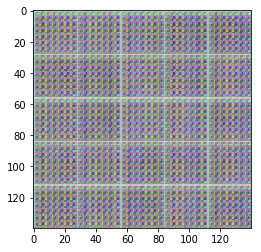

Epoch 1/5... Discriminator Loss: 1.4249... Generator Loss: 0.5297
Epoch 1/5... Discriminator Loss: 1.4207... Generator Loss: 0.5380
Epoch 1/5... Discriminator Loss: 1.4155... Generator Loss: 0.5503
Epoch 1/5... Discriminator Loss: 1.4155... Generator Loss: 0.5515
Epoch 1/5... Discriminator Loss: 1.4204... Generator Loss: 0.5504
Epoch 1/5... Discriminator Loss: 1.4340... Generator Loss: 0.5602
Epoch 1/5... Discriminator Loss: 1.4219... Generator Loss: 0.5584
Epoch 1/5... Discriminator Loss: 1.4248... Generator Loss: 0.5616
Epoch 1/5... Discriminator Loss: 1.4287... Generator Loss: 0.5638
Epoch 1/5... Discriminator Loss: 1.4276... Generator Loss: 0.5627


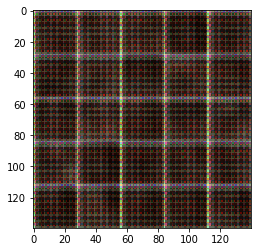

Epoch 1/5... Discriminator Loss: 1.4209... Generator Loss: 0.5707
Epoch 1/5... Discriminator Loss: 1.4198... Generator Loss: 0.5665
Epoch 1/5... Discriminator Loss: 1.4217... Generator Loss: 0.5812
Epoch 1/5... Discriminator Loss: 1.4312... Generator Loss: 0.5664
Epoch 1/5... Discriminator Loss: 1.4195... Generator Loss: 0.5816
Epoch 1/5... Discriminator Loss: 1.4185... Generator Loss: 0.5897
Epoch 1/5... Discriminator Loss: 1.4206... Generator Loss: 0.5885
Epoch 1/5... Discriminator Loss: 1.4162... Generator Loss: 0.5954
Epoch 1/5... Discriminator Loss: 1.4138... Generator Loss: 0.5963
Epoch 1/5... Discriminator Loss: 1.4105... Generator Loss: 0.6001


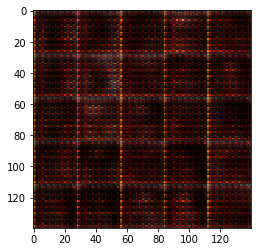

Epoch 1/5... Discriminator Loss: 1.4144... Generator Loss: 0.5961
Epoch 1/5... Discriminator Loss: 1.4211... Generator Loss: 0.5855
Epoch 1/5... Discriminator Loss: 1.4157... Generator Loss: 0.6030
Epoch 1/5... Discriminator Loss: 1.4146... Generator Loss: 0.6032
Epoch 1/5... Discriminator Loss: 1.4095... Generator Loss: 0.6076
Epoch 1/5... Discriminator Loss: 1.4173... Generator Loss: 0.6026
Epoch 1/5... Discriminator Loss: 1.4094... Generator Loss: 0.6108
Epoch 1/5... Discriminator Loss: 1.4094... Generator Loss: 0.6092
Epoch 1/5... Discriminator Loss: 1.4086... Generator Loss: 0.6145
Epoch 1/5... Discriminator Loss: 1.4092... Generator Loss: 0.6156


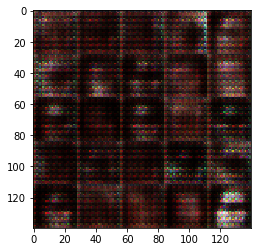

Epoch 1/5... Discriminator Loss: 1.4035... Generator Loss: 0.6190
Epoch 1/5... Discriminator Loss: 1.4048... Generator Loss: 0.6198
Epoch 1/5... Discriminator Loss: 1.4063... Generator Loss: 0.6161
Epoch 1/5... Discriminator Loss: 1.4037... Generator Loss: 0.6205
Epoch 1/5... Discriminator Loss: 1.4029... Generator Loss: 0.6229
Epoch 1/5... Discriminator Loss: 1.4075... Generator Loss: 0.6183
Epoch 1/5... Discriminator Loss: 1.4063... Generator Loss: 0.6251
Epoch 1/5... Discriminator Loss: 1.4055... Generator Loss: 0.6243
Epoch 1/5... Discriminator Loss: 1.4042... Generator Loss: 0.6298
Epoch 1/5... Discriminator Loss: 1.4046... Generator Loss: 0.6301


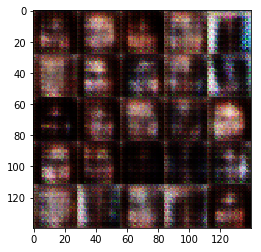

Epoch 1/5... Discriminator Loss: 1.4025... Generator Loss: 0.6291
Epoch 1/5... Discriminator Loss: 1.4041... Generator Loss: 0.6320
Epoch 1/5... Discriminator Loss: 1.4032... Generator Loss: 0.6337
Epoch 1/5... Discriminator Loss: 1.4026... Generator Loss: 0.6320
Epoch 1/5... Discriminator Loss: 1.4015... Generator Loss: 0.6348
Epoch 1/5... Discriminator Loss: 1.4050... Generator Loss: 0.6303
Epoch 1/5... Discriminator Loss: 1.3998... Generator Loss: 0.6374
Epoch 1/5... Discriminator Loss: 1.3977... Generator Loss: 0.6416
Epoch 1/5... Discriminator Loss: 1.4004... Generator Loss: 0.6383
Epoch 1/5... Discriminator Loss: 1.4010... Generator Loss: 0.6401


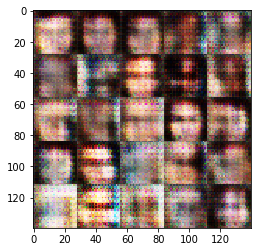

Epoch 1/5... Discriminator Loss: 1.3998... Generator Loss: 0.6400
Epoch 1/5... Discriminator Loss: 1.3997... Generator Loss: 0.6420
Epoch 1/5... Discriminator Loss: 1.3993... Generator Loss: 0.6418
Epoch 1/5... Discriminator Loss: 1.4014... Generator Loss: 0.6430
Epoch 1/5... Discriminator Loss: 1.3982... Generator Loss: 0.6451
Epoch 1/5... Discriminator Loss: 1.3981... Generator Loss: 0.6467
Epoch 1/5... Discriminator Loss: 1.3989... Generator Loss: 0.6450
Epoch 1/5... Discriminator Loss: 1.3977... Generator Loss: 0.6472
Epoch 1/5... Discriminator Loss: 1.3972... Generator Loss: 0.6482
Epoch 1/5... Discriminator Loss: 1.3963... Generator Loss: 0.6501


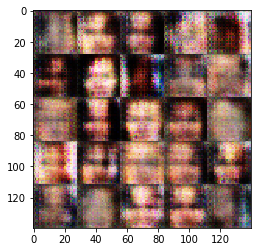

Epoch 1/5... Discriminator Loss: 1.3990... Generator Loss: 0.6497
Epoch 1/5... Discriminator Loss: 1.3979... Generator Loss: 0.6503
Epoch 1/5... Discriminator Loss: 1.3970... Generator Loss: 0.6500
Epoch 1/5... Discriminator Loss: 1.3952... Generator Loss: 0.6525
Epoch 1/5... Discriminator Loss: 1.3972... Generator Loss: 0.6522
Epoch 1/5... Discriminator Loss: 1.3980... Generator Loss: 0.6510
Epoch 1/5... Discriminator Loss: 1.3967... Generator Loss: 0.6537
Epoch 1/5... Discriminator Loss: 1.3959... Generator Loss: 0.6546
Epoch 1/5... Discriminator Loss: 1.3968... Generator Loss: 0.6498
Epoch 1/5... Discriminator Loss: 1.3968... Generator Loss: 0.6549


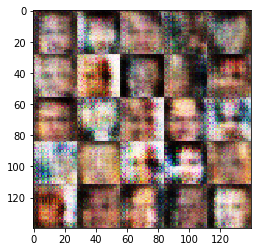

Epoch 1/5... Discriminator Loss: 1.3957... Generator Loss: 0.6561
Epoch 1/5... Discriminator Loss: 1.3939... Generator Loss: 0.6568
Epoch 1/5... Discriminator Loss: 1.3966... Generator Loss: 0.6570
Epoch 1/5... Discriminator Loss: 1.3951... Generator Loss: 0.6554
Epoch 1/5... Discriminator Loss: 1.3956... Generator Loss: 0.6548
Epoch 1/5... Discriminator Loss: 1.3936... Generator Loss: 0.6603
Epoch 1/5... Discriminator Loss: 1.3964... Generator Loss: 0.6562
Epoch 1/5... Discriminator Loss: 1.3937... Generator Loss: 0.6601
Epoch 1/5... Discriminator Loss: 1.3941... Generator Loss: 0.6612
Epoch 1/5... Discriminator Loss: 1.3938... Generator Loss: 0.6610


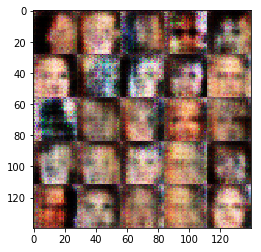

Epoch 1/5... Discriminator Loss: 1.3936... Generator Loss: 0.6621
Epoch 1/5... Discriminator Loss: 1.3939... Generator Loss: 0.6616
Epoch 1/5... Discriminator Loss: 1.3938... Generator Loss: 0.6620
Epoch 1/5... Discriminator Loss: 1.3927... Generator Loss: 0.6623
Epoch 1/5... Discriminator Loss: 1.3968... Generator Loss: 0.6601
Epoch 1/5... Discriminator Loss: 1.3933... Generator Loss: 0.6640
Epoch 1/5... Discriminator Loss: 1.3934... Generator Loss: 0.6642
Epoch 1/5... Discriminator Loss: 1.3924... Generator Loss: 0.6632
Epoch 1/5... Discriminator Loss: 1.3923... Generator Loss: 0.6654
Epoch 1/5... Discriminator Loss: 1.3953... Generator Loss: 0.6582


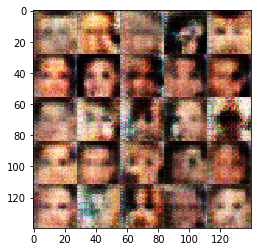

Epoch 1/5... Discriminator Loss: 1.3933... Generator Loss: 0.6628
Epoch 1/5... Discriminator Loss: 1.3931... Generator Loss: 0.6650
Epoch 1/5... Discriminator Loss: 1.3926... Generator Loss: 0.6660
Epoch 1/5... Discriminator Loss: 1.3923... Generator Loss: 0.6671
Epoch 1/5... Discriminator Loss: 1.3935... Generator Loss: 0.6635
Epoch 1/5... Discriminator Loss: 1.3931... Generator Loss: 0.6647
Epoch 1/5... Discriminator Loss: 1.3931... Generator Loss: 0.6665
Epoch 1/5... Discriminator Loss: 1.3927... Generator Loss: 0.6671
Epoch 1/5... Discriminator Loss: 1.3919... Generator Loss: 0.6684
Epoch 1/5... Discriminator Loss: 1.3920... Generator Loss: 0.6676


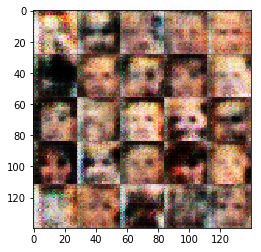

Epoch 1/5... Discriminator Loss: 1.3918... Generator Loss: 0.6684
Epoch 1/5... Discriminator Loss: 1.3909... Generator Loss: 0.6691
Epoch 1/5... Discriminator Loss: 1.3921... Generator Loss: 0.6685
Epoch 1/5... Discriminator Loss: 1.3907... Generator Loss: 0.6703
Epoch 1/5... Discriminator Loss: 1.3910... Generator Loss: 0.6670
Epoch 1/5... Discriminator Loss: 1.3918... Generator Loss: 0.6698
Epoch 1/5... Discriminator Loss: 1.3916... Generator Loss: 0.6705
Epoch 1/5... Discriminator Loss: 1.3928... Generator Loss: 0.6669
Epoch 1/5... Discriminator Loss: 1.3911... Generator Loss: 0.6710
Epoch 1/5... Discriminator Loss: 1.3918... Generator Loss: 0.6699


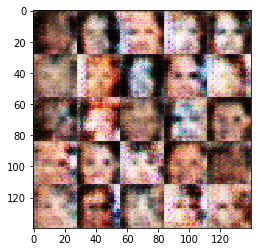

Epoch 1/5... Discriminator Loss: 1.3912... Generator Loss: 0.6704
Epoch 1/5... Discriminator Loss: 1.3914... Generator Loss: 0.6713
Epoch 1/5... Discriminator Loss: 1.3922... Generator Loss: 0.6685
Epoch 1/5... Discriminator Loss: 1.3919... Generator Loss: 0.6716
Epoch 1/5... Discriminator Loss: 1.3907... Generator Loss: 0.6724
Epoch 1/5... Discriminator Loss: 1.3914... Generator Loss: 0.6724
Epoch 1/5... Discriminator Loss: 1.3908... Generator Loss: 0.6733
Epoch 1/5... Discriminator Loss: 1.3908... Generator Loss: 0.6735
Epoch 1/5... Discriminator Loss: 1.3908... Generator Loss: 0.6739
Epoch 1/5... Discriminator Loss: 1.3897... Generator Loss: 0.6741


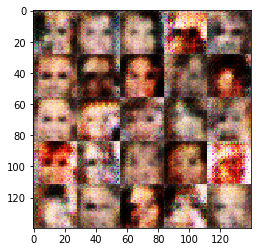

Epoch 1/5... Discriminator Loss: 1.3904... Generator Loss: 0.6741
Epoch 1/5... Discriminator Loss: 1.3906... Generator Loss: 0.6736
Epoch 1/5... Discriminator Loss: 1.3904... Generator Loss: 0.6748
Epoch 1/5... Discriminator Loss: 1.3903... Generator Loss: 0.6743
Epoch 1/5... Discriminator Loss: 1.3909... Generator Loss: 0.6736
Epoch 1/5... Discriminator Loss: 1.3912... Generator Loss: 0.6742
Epoch 1/5... Discriminator Loss: 1.3904... Generator Loss: 0.6752
Epoch 1/5... Discriminator Loss: 1.3898... Generator Loss: 0.6753
Epoch 1/5... Discriminator Loss: 1.3918... Generator Loss: 0.6713
Epoch 1/5... Discriminator Loss: 1.3902... Generator Loss: 0.6750


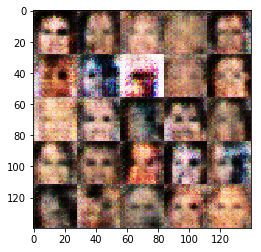

Epoch 1/5... Discriminator Loss: 1.3900... Generator Loss: 0.6752
Epoch 1/5... Discriminator Loss: 1.3898... Generator Loss: 0.6762
Epoch 1/5... Discriminator Loss: 1.3894... Generator Loss: 0.6763
Epoch 1/5... Discriminator Loss: 1.3897... Generator Loss: 0.6766
Epoch 1/5... Discriminator Loss: 1.3911... Generator Loss: 0.6756
Epoch 1/5... Discriminator Loss: 1.3901... Generator Loss: 0.6770
Epoch 1/5... Discriminator Loss: 1.3903... Generator Loss: 0.6762
Epoch 1/5... Discriminator Loss: 1.3892... Generator Loss: 0.6776
Epoch 1/5... Discriminator Loss: 1.3905... Generator Loss: 0.6768
Epoch 1/5... Discriminator Loss: 1.3889... Generator Loss: 0.6770


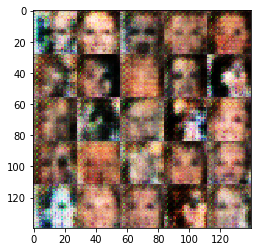

Epoch 1/5... Discriminator Loss: 1.3896... Generator Loss: 0.6779
Epoch 1/5... Discriminator Loss: 1.3893... Generator Loss: 0.6773
Epoch 1/5... Discriminator Loss: 1.3890... Generator Loss: 0.6784
Epoch 1/5... Discriminator Loss: 1.3893... Generator Loss: 0.6781
Epoch 1/5... Discriminator Loss: 1.3894... Generator Loss: 0.6784
Epoch 1/5... Discriminator Loss: 1.3898... Generator Loss: 0.6785
Epoch 1/5... Discriminator Loss: 1.3902... Generator Loss: 0.6772
Epoch 1/5... Discriminator Loss: 1.3892... Generator Loss: 0.6793
Epoch 1/5... Discriminator Loss: 1.3893... Generator Loss: 0.6752
Epoch 1/5... Discriminator Loss: 1.3892... Generator Loss: 0.6790


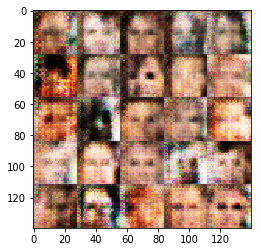

Epoch 1/5... Discriminator Loss: 1.3895... Generator Loss: 0.6786
Epoch 1/5... Discriminator Loss: 1.3884... Generator Loss: 0.6797
Epoch 1/5... Discriminator Loss: 1.3886... Generator Loss: 0.6797
Epoch 1/5... Discriminator Loss: 1.3891... Generator Loss: 0.6784
Epoch 1/5... Discriminator Loss: 1.3899... Generator Loss: 0.6791
Epoch 1/5... Discriminator Loss: 1.3888... Generator Loss: 0.6760
Epoch 1/5... Discriminator Loss: 1.3890... Generator Loss: 0.6796
Epoch 1/5... Discriminator Loss: 1.3895... Generator Loss: 0.6799
Epoch 1/5... Discriminator Loss: 1.3891... Generator Loss: 0.6806
Epoch 1/5... Discriminator Loss: 1.3893... Generator Loss: 0.6780


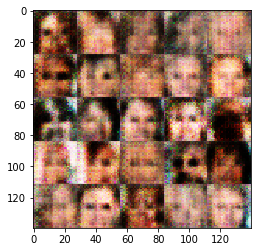

Epoch 1/5... Discriminator Loss: 1.3886... Generator Loss: 0.6804
Epoch 1/5... Discriminator Loss: 1.3886... Generator Loss: 0.6806
Epoch 1/5... Discriminator Loss: 1.3889... Generator Loss: 0.6811
Epoch 1/5... Discriminator Loss: 1.3892... Generator Loss: 0.6797
Epoch 1/5... Discriminator Loss: 1.3888... Generator Loss: 0.6812
Epoch 1/5... Discriminator Loss: 1.3888... Generator Loss: 0.6812
Epoch 1/5... Discriminator Loss: 1.3892... Generator Loss: 0.6809
Epoch 1/5... Discriminator Loss: 1.3895... Generator Loss: 0.6811
Epoch 1/5... Discriminator Loss: 1.3891... Generator Loss: 0.6803
Epoch 1/5... Discriminator Loss: 1.3881... Generator Loss: 0.6819


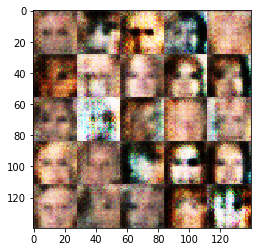

Epoch 1/5... Discriminator Loss: 1.3891... Generator Loss: 0.6813
Epoch 1/5... Discriminator Loss: 1.3899... Generator Loss: 0.6755
Epoch 1/5... Discriminator Loss: 1.3878... Generator Loss: 0.6807
Epoch 1/5... Discriminator Loss: 1.3882... Generator Loss: 0.6812
Epoch 1/5... Discriminator Loss: 1.3885... Generator Loss: 0.6815
Epoch 1/5... Discriminator Loss: 1.3878... Generator Loss: 0.6818
Epoch 1/5... Discriminator Loss: 1.3886... Generator Loss: 0.6819
Epoch 1/5... Discriminator Loss: 1.3887... Generator Loss: 0.6817
Epoch 1/5... Discriminator Loss: 1.3881... Generator Loss: 0.6807
Epoch 1/5... Discriminator Loss: 1.3921... Generator Loss: 0.6775


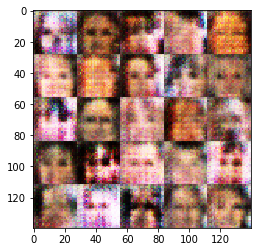

Epoch 1/5... Discriminator Loss: 1.3899... Generator Loss: 0.6803
Epoch 1/5... Discriminator Loss: 1.3953... Generator Loss: 0.6711
Epoch 1/5... Discriminator Loss: 1.3886... Generator Loss: 0.6803
Epoch 1/5... Discriminator Loss: 1.3895... Generator Loss: 0.6816
Epoch 1/5... Discriminator Loss: 1.3886... Generator Loss: 0.6824
Epoch 1/5... Discriminator Loss: 1.3884... Generator Loss: 0.6827
Epoch 1/5... Discriminator Loss: 1.3881... Generator Loss: 0.6830
Epoch 1/5... Discriminator Loss: 1.3882... Generator Loss: 0.6828
Epoch 1/5... Discriminator Loss: 1.3884... Generator Loss: 0.6829
Epoch 1/5... Discriminator Loss: 1.3881... Generator Loss: 0.6834


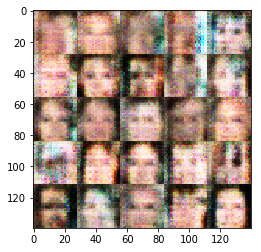

Epoch 1/5... Discriminator Loss: 1.3882... Generator Loss: 0.6824
Epoch 1/5... Discriminator Loss: 1.3882... Generator Loss: 0.6832
Epoch 1/5... Discriminator Loss: 1.3881... Generator Loss: 0.6836
Epoch 1/5... Discriminator Loss: 1.3888... Generator Loss: 0.6831
Epoch 1/5... Discriminator Loss: 1.3882... Generator Loss: 0.6835
Epoch 1/5... Discriminator Loss: 1.3887... Generator Loss: 0.6834
Epoch 1/5... Discriminator Loss: 1.3873... Generator Loss: 0.6821
Epoch 1/5... Discriminator Loss: 1.3877... Generator Loss: 0.6845
Epoch 1/5... Discriminator Loss: 1.3889... Generator Loss: 0.6824
Epoch 1/5... Discriminator Loss: 1.3879... Generator Loss: 0.6838


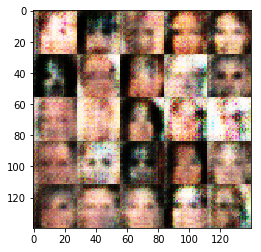

Epoch 1/5... Discriminator Loss: 1.3886... Generator Loss: 0.6836
Epoch 1/5... Discriminator Loss: 1.3883... Generator Loss: 0.6831
Epoch 1/5... Discriminator Loss: 1.3893... Generator Loss: 0.6811
Epoch 1/5... Discriminator Loss: 1.3883... Generator Loss: 0.6840
Epoch 1/5... Discriminator Loss: 1.3882... Generator Loss: 0.6844
Epoch 1/5... Discriminator Loss: 1.3877... Generator Loss: 0.6845
Epoch 1/5... Discriminator Loss: 1.3878... Generator Loss: 0.6850
Epoch 1/5... Discriminator Loss: 1.3879... Generator Loss: 0.6849
Epoch 1/5... Discriminator Loss: 1.3879... Generator Loss: 0.6850
Epoch 1/5... Discriminator Loss: 1.3881... Generator Loss: 0.6848


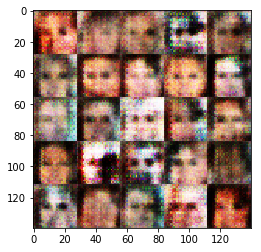

Epoch 1/5... Discriminator Loss: 1.3885... Generator Loss: 0.6838
Epoch 1/5... Discriminator Loss: 1.3890... Generator Loss: 0.6830
Epoch 1/5... Discriminator Loss: 1.3907... Generator Loss: 0.6776
Epoch 1/5... Discriminator Loss: 1.3876... Generator Loss: 0.6847
Epoch 1/5... Discriminator Loss: 1.3885... Generator Loss: 0.6845
Epoch 1/5... Discriminator Loss: 1.3878... Generator Loss: 0.6855
Epoch 1/5... Discriminator Loss: 1.3865... Generator Loss: 0.6854
Epoch 1/5... Discriminator Loss: 1.3895... Generator Loss: 0.6792
Epoch 1/5... Discriminator Loss: 1.3890... Generator Loss: 0.6826
Epoch 1/5... Discriminator Loss: 1.3879... Generator Loss: 0.6850


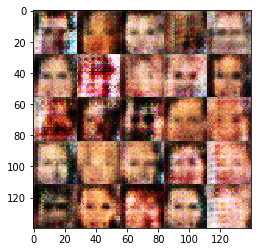

Epoch 1/5... Discriminator Loss: 1.3889... Generator Loss: 0.6843
Epoch 1/5... Discriminator Loss: 1.3885... Generator Loss: 0.6848
Epoch 1/5... Discriminator Loss: 1.3903... Generator Loss: 0.6817
Epoch 1/5... Discriminator Loss: 1.3873... Generator Loss: 0.6858
Epoch 1/5... Discriminator Loss: 1.3875... Generator Loss: 0.6855
Epoch 1/5... Discriminator Loss: 1.3887... Generator Loss: 0.6844
Epoch 1/5... Discriminator Loss: 1.3872... Generator Loss: 0.6853
Epoch 1/5... Discriminator Loss: 1.3879... Generator Loss: 0.6855
Epoch 1/5... Discriminator Loss: 1.3887... Generator Loss: 0.6849
Epoch 1/5... Discriminator Loss: 1.3885... Generator Loss: 0.6838


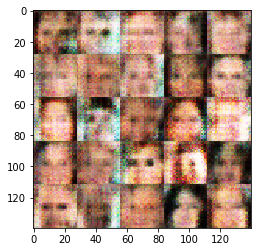

Epoch 1/5... Discriminator Loss: 1.3878... Generator Loss: 0.6850
Epoch 1/5... Discriminator Loss: 1.3873... Generator Loss: 0.6867
Epoch 1/5... Discriminator Loss: 1.3882... Generator Loss: 0.6861
Epoch 1/5... Discriminator Loss: 1.3877... Generator Loss: 0.6865
Epoch 1/5... Discriminator Loss: 1.3875... Generator Loss: 0.6867
Epoch 1/5... Discriminator Loss: 1.3873... Generator Loss: 0.6870
Epoch 1/5... Discriminator Loss: 1.3875... Generator Loss: 0.6869
Epoch 1/5... Discriminator Loss: 1.3876... Generator Loss: 0.6858
Epoch 1/5... Discriminator Loss: 1.3875... Generator Loss: 0.6868
Epoch 1/5... Discriminator Loss: 1.3873... Generator Loss: 0.6866


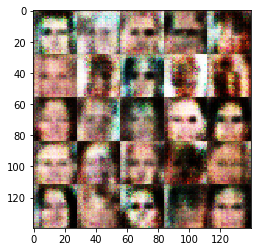

Epoch 1/5... Discriminator Loss: 1.3872... Generator Loss: 0.6867
Epoch 1/5... Discriminator Loss: 1.3880... Generator Loss: 0.6860
Epoch 1/5... Discriminator Loss: 1.3874... Generator Loss: 0.6871
Epoch 1/5... Discriminator Loss: 1.3878... Generator Loss: 0.6867
Epoch 1/5... Discriminator Loss: 1.3880... Generator Loss: 0.6866
Epoch 1/5... Discriminator Loss: 1.3878... Generator Loss: 0.6831
Epoch 1/5... Discriminator Loss: 1.3871... Generator Loss: 0.6871
Epoch 1/5... Discriminator Loss: 1.3874... Generator Loss: 0.6869
Epoch 1/5... Discriminator Loss: 1.3875... Generator Loss: 0.6872
Epoch 1/5... Discriminator Loss: 1.3875... Generator Loss: 0.6870


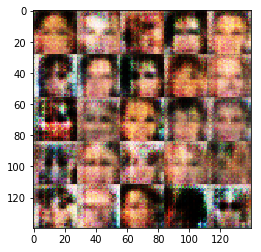

Epoch 1/5... Discriminator Loss: 1.3889... Generator Loss: 0.6852
Epoch 1/5... Discriminator Loss: 1.3871... Generator Loss: 0.6867
Epoch 1/5... Discriminator Loss: 1.3875... Generator Loss: 0.6871
Epoch 1/5... Discriminator Loss: 1.3900... Generator Loss: 0.6835
Epoch 1/5... Discriminator Loss: 1.3871... Generator Loss: 0.6876
Epoch 1/5... Discriminator Loss: 1.3891... Generator Loss: 0.6851
Epoch 1/5... Discriminator Loss: 1.3872... Generator Loss: 0.6867
Epoch 1/5... Discriminator Loss: 1.3883... Generator Loss: 0.6864
Epoch 1/5... Discriminator Loss: 1.3872... Generator Loss: 0.6872
Epoch 1/5... Discriminator Loss: 1.3874... Generator Loss: 0.6875


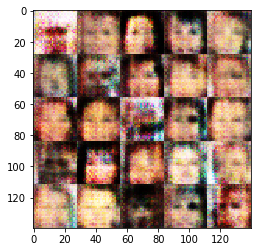

Epoch 1/5... Discriminator Loss: 1.3868... Generator Loss: 0.6873
Epoch 1/5... Discriminator Loss: 1.3874... Generator Loss: 0.6878
Epoch 1/5... Discriminator Loss: 1.3866... Generator Loss: 0.6876
Epoch 1/5... Discriminator Loss: 1.3878... Generator Loss: 0.6875
Epoch 1/5... Discriminator Loss: 1.3879... Generator Loss: 0.6860
Epoch 1/5... Discriminator Loss: 1.3872... Generator Loss: 0.6880
Epoch 1/5... Discriminator Loss: 1.3872... Generator Loss: 0.6881
Epoch 1/5... Discriminator Loss: 1.3873... Generator Loss: 0.6880
Epoch 1/5... Discriminator Loss: 1.3873... Generator Loss: 0.6880
Epoch 1/5... Discriminator Loss: 1.3872... Generator Loss: 0.6883


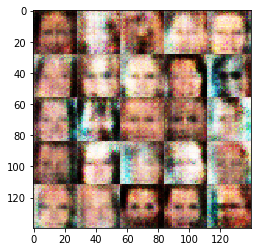

Epoch 1/5... Discriminator Loss: 1.3873... Generator Loss: 0.6880
Epoch 1/5... Discriminator Loss: 1.3874... Generator Loss: 0.6882
Epoch 1/5... Discriminator Loss: 1.3873... Generator Loss: 0.6883
Epoch 1/5... Discriminator Loss: 1.3871... Generator Loss: 0.6882
Epoch 1/5... Discriminator Loss: 1.3871... Generator Loss: 0.6883
Epoch 1/5... Discriminator Loss: 1.3874... Generator Loss: 0.6882
Epoch 1/5... Discriminator Loss: 1.3873... Generator Loss: 0.6880
Epoch 1/5... Discriminator Loss: 1.3888... Generator Loss: 0.6852
Epoch 1/5... Discriminator Loss: 1.3869... Generator Loss: 0.6876
Epoch 1/5... Discriminator Loss: 1.3897... Generator Loss: 0.6841


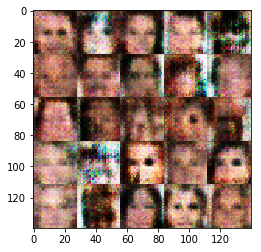

Epoch 1/5... Discriminator Loss: 1.3888... Generator Loss: 0.6856
Epoch 1/5... Discriminator Loss: 1.3872... Generator Loss: 0.6878
Epoch 1/5... Discriminator Loss: 1.3883... Generator Loss: 0.6869
Epoch 1/5... Discriminator Loss: 1.3877... Generator Loss: 0.6878
Epoch 1/5... Discriminator Loss: 1.3875... Generator Loss: 0.6882
Epoch 1/5... Discriminator Loss: 1.3872... Generator Loss: 0.6883
Epoch 1/5... Discriminator Loss: 1.3871... Generator Loss: 0.6889
Epoch 1/5... Discriminator Loss: 1.3870... Generator Loss: 0.6888
Epoch 1/5... Discriminator Loss: 1.3872... Generator Loss: 0.6886
Epoch 1/5... Discriminator Loss: 1.3880... Generator Loss: 0.6859


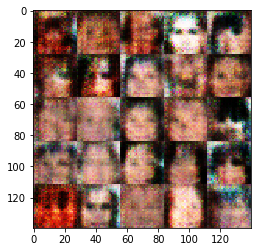

Epoch 1/5... Discriminator Loss: 1.3870... Generator Loss: 0.6890
Epoch 1/5... Discriminator Loss: 1.3870... Generator Loss: 0.6842
Epoch 1/5... Discriminator Loss: 1.3869... Generator Loss: 0.6879
Epoch 1/5... Discriminator Loss: 1.3872... Generator Loss: 0.6887
Epoch 1/5... Discriminator Loss: 1.3875... Generator Loss: 0.6877
Epoch 1/5... Discriminator Loss: 1.3863... Generator Loss: 0.6885
Epoch 1/5... Discriminator Loss: 1.3890... Generator Loss: 0.6866
Epoch 1/5... Discriminator Loss: 1.3871... Generator Loss: 0.6875
Epoch 1/5... Discriminator Loss: 1.3869... Generator Loss: 0.6885
Epoch 1/5... Discriminator Loss: 1.3871... Generator Loss: 0.6885


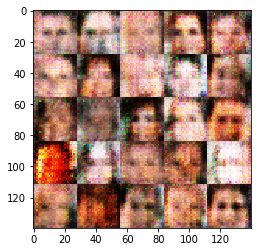

Epoch 1/5... Discriminator Loss: 1.3883... Generator Loss: 0.6874
Epoch 1/5... Discriminator Loss: 1.3878... Generator Loss: 0.6876
Epoch 1/5... Discriminator Loss: 1.3874... Generator Loss: 0.6890
Epoch 1/5... Discriminator Loss: 1.3871... Generator Loss: 0.6891
Epoch 1/5... Discriminator Loss: 1.3882... Generator Loss: 0.6881
Epoch 1/5... Discriminator Loss: 1.3893... Generator Loss: 0.6839
Epoch 2/5... Discriminator Loss: 1.3862... Generator Loss: 0.6892
Epoch 2/5... Discriminator Loss: 1.3873... Generator Loss: 0.6888
Epoch 2/5... Discriminator Loss: 1.3876... Generator Loss: 0.6886
Epoch 2/5... Discriminator Loss: 1.3869... Generator Loss: 0.6893


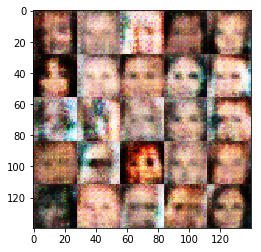

Epoch 2/5... Discriminator Loss: 1.3881... Generator Loss: 0.6883
Epoch 2/5... Discriminator Loss: 1.3872... Generator Loss: 0.6883
Epoch 2/5... Discriminator Loss: 1.3874... Generator Loss: 0.6892
Epoch 2/5... Discriminator Loss: 1.3882... Generator Loss: 0.6877
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6888
Epoch 2/5... Discriminator Loss: 1.3880... Generator Loss: 0.6884
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6877
Epoch 2/5... Discriminator Loss: 1.3868... Generator Loss: 0.6891
Epoch 2/5... Discriminator Loss: 1.3884... Generator Loss: 0.6880
Epoch 2/5... Discriminator Loss: 1.3872... Generator Loss: 0.6868


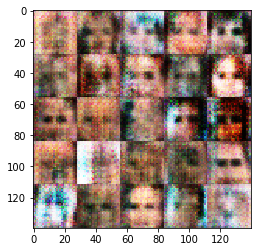

Epoch 2/5... Discriminator Loss: 1.3874... Generator Loss: 0.6891
Epoch 2/5... Discriminator Loss: 1.3868... Generator Loss: 0.6879
Epoch 2/5... Discriminator Loss: 1.3886... Generator Loss: 0.6878
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6892
Epoch 2/5... Discriminator Loss: 1.3881... Generator Loss: 0.6876
Epoch 2/5... Discriminator Loss: 1.3863... Generator Loss: 0.6889
Epoch 2/5... Discriminator Loss: 1.3859... Generator Loss: 0.6893
Epoch 2/5... Discriminator Loss: 1.3883... Generator Loss: 0.6871
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6894
Epoch 2/5... Discriminator Loss: 1.3873... Generator Loss: 0.6893


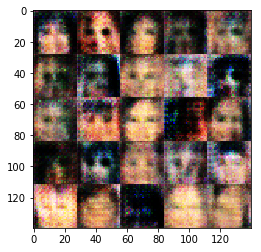

Epoch 2/5... Discriminator Loss: 1.3869... Generator Loss: 0.6891
Epoch 2/5... Discriminator Loss: 1.3874... Generator Loss: 0.6892
Epoch 2/5... Discriminator Loss: 1.3868... Generator Loss: 0.6896
Epoch 2/5... Discriminator Loss: 1.3875... Generator Loss: 0.6892
Epoch 2/5... Discriminator Loss: 1.3868... Generator Loss: 0.6896
Epoch 2/5... Discriminator Loss: 1.3877... Generator Loss: 0.6885
Epoch 2/5... Discriminator Loss: 1.3869... Generator Loss: 0.6899
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6887
Epoch 2/5... Discriminator Loss: 1.3873... Generator Loss: 0.6891
Epoch 2/5... Discriminator Loss: 1.3895... Generator Loss: 0.6846


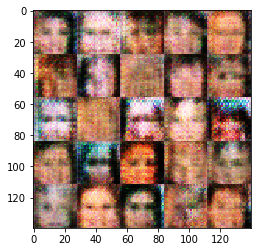

Epoch 2/5... Discriminator Loss: 1.3868... Generator Loss: 0.6900
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6871
Epoch 2/5... Discriminator Loss: 1.3878... Generator Loss: 0.6887
Epoch 2/5... Discriminator Loss: 1.3863... Generator Loss: 0.6895
Epoch 2/5... Discriminator Loss: 1.3874... Generator Loss: 0.6893
Epoch 2/5... Discriminator Loss: 1.3870... Generator Loss: 0.6900
Epoch 2/5... Discriminator Loss: 1.3879... Generator Loss: 0.6891
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6898
Epoch 2/5... Discriminator Loss: 1.3887... Generator Loss: 0.6876
Epoch 2/5... Discriminator Loss: 1.3870... Generator Loss: 0.6900


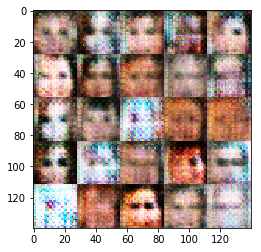

Epoch 2/5... Discriminator Loss: 1.3868... Generator Loss: 0.6869
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6899
Epoch 2/5... Discriminator Loss: 1.3870... Generator Loss: 0.6879
Epoch 2/5... Discriminator Loss: 1.3873... Generator Loss: 0.6896
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6899
Epoch 2/5... Discriminator Loss: 1.3874... Generator Loss: 0.6897
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6902
Epoch 2/5... Discriminator Loss: 1.3871... Generator Loss: 0.6878
Epoch 2/5... Discriminator Loss: 1.3876... Generator Loss: 0.6892
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6898


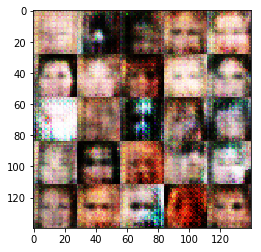

Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6900
Epoch 2/5... Discriminator Loss: 1.3869... Generator Loss: 0.6902
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6900
Epoch 2/5... Discriminator Loss: 1.3882... Generator Loss: 0.6888
Epoch 2/5... Discriminator Loss: 1.3870... Generator Loss: 0.6899
Epoch 2/5... Discriminator Loss: 1.4064... Generator Loss: 0.6697
Epoch 2/5... Discriminator Loss: 1.3875... Generator Loss: 0.6891
Epoch 2/5... Discriminator Loss: 1.3873... Generator Loss: 0.6898
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6902
Epoch 2/5... Discriminator Loss: 1.3878... Generator Loss: 0.6894


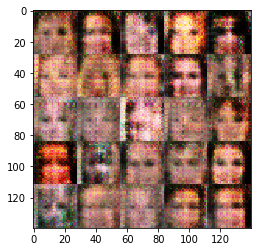

Epoch 2/5... Discriminator Loss: 1.3849... Generator Loss: 0.6901
Epoch 2/5... Discriminator Loss: 1.3875... Generator Loss: 0.6888
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6903
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6899
Epoch 2/5... Discriminator Loss: 1.3899... Generator Loss: 0.6842
Epoch 2/5... Discriminator Loss: 1.3858... Generator Loss: 0.6898
Epoch 2/5... Discriminator Loss: 1.3869... Generator Loss: 0.6884
Epoch 2/5... Discriminator Loss: 1.3868... Generator Loss: 0.6897
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6896
Epoch 2/5... Discriminator Loss: 1.3888... Generator Loss: 0.6884


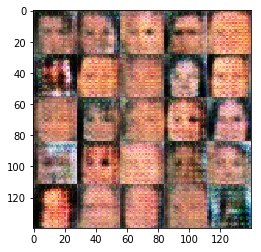

Epoch 2/5... Discriminator Loss: 1.3869... Generator Loss: 0.6896
Epoch 2/5... Discriminator Loss: 1.3879... Generator Loss: 0.6886
Epoch 2/5... Discriminator Loss: 1.3874... Generator Loss: 0.6901
Epoch 2/5... Discriminator Loss: 1.3869... Generator Loss: 0.6906
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6905
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6902
Epoch 2/5... Discriminator Loss: 1.3873... Generator Loss: 0.6903
Epoch 2/5... Discriminator Loss: 1.3853... Generator Loss: 0.6901
Epoch 2/5... Discriminator Loss: 1.3980... Generator Loss: 0.6699
Epoch 2/5... Discriminator Loss: 1.3868... Generator Loss: 0.6906


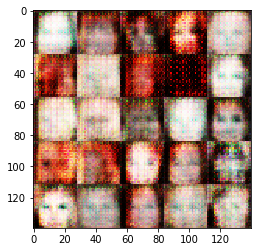

Epoch 2/5... Discriminator Loss: 1.3816... Generator Loss: 0.6886
Epoch 2/5... Discriminator Loss: 1.3885... Generator Loss: 0.6863
Epoch 2/5... Discriminator Loss: 1.3868... Generator Loss: 0.6901
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6895
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6895
Epoch 2/5... Discriminator Loss: 1.3870... Generator Loss: 0.6901
Epoch 2/5... Discriminator Loss: 1.3871... Generator Loss: 0.6881
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6906
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6904
Epoch 2/5... Discriminator Loss: 1.3868... Generator Loss: 0.6902


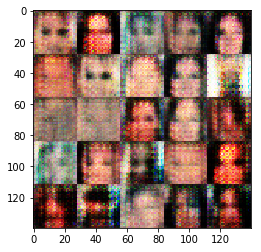

Epoch 2/5... Discriminator Loss: 1.3869... Generator Loss: 0.6904
Epoch 2/5... Discriminator Loss: 1.3870... Generator Loss: 0.6905
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6905
Epoch 2/5... Discriminator Loss: 1.3870... Generator Loss: 0.6903
Epoch 2/5... Discriminator Loss: 1.3859... Generator Loss: 0.6899
Epoch 2/5... Discriminator Loss: 1.3870... Generator Loss: 0.6902
Epoch 2/5... Discriminator Loss: 1.3870... Generator Loss: 0.6905
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6909
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6910
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6909


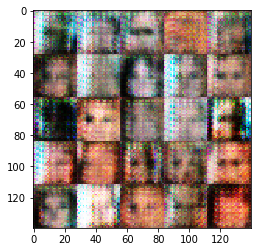

Epoch 2/5... Discriminator Loss: 1.3871... Generator Loss: 0.6905
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6909
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6907
Epoch 2/5... Discriminator Loss: 1.3876... Generator Loss: 0.6894
Epoch 2/5... Discriminator Loss: 1.3869... Generator Loss: 0.6907
Epoch 2/5... Discriminator Loss: 1.3855... Generator Loss: 0.6904
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6909
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6907
Epoch 2/5... Discriminator Loss: 1.3870... Generator Loss: 0.6893
Epoch 2/5... Discriminator Loss: 1.3868... Generator Loss: 0.6907


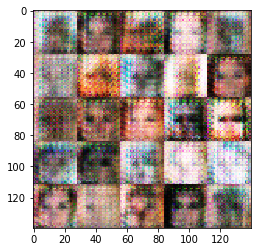

Epoch 2/5... Discriminator Loss: 1.3870... Generator Loss: 0.6902
Epoch 2/5... Discriminator Loss: 1.3872... Generator Loss: 0.6905
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6909
Epoch 2/5... Discriminator Loss: 1.3868... Generator Loss: 0.6900
Epoch 2/5... Discriminator Loss: 1.3880... Generator Loss: 0.6895
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6910
Epoch 2/5... Discriminator Loss: 1.3883... Generator Loss: 0.6877
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6910
Epoch 2/5... Discriminator Loss: 1.3863... Generator Loss: 0.6909
Epoch 2/5... Discriminator Loss: 1.3880... Generator Loss: 0.6890


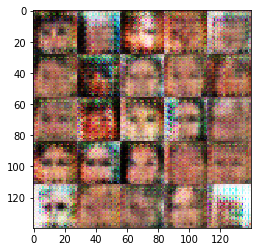

Epoch 2/5... Discriminator Loss: 1.3873... Generator Loss: 0.6904
Epoch 2/5... Discriminator Loss: 1.3861... Generator Loss: 0.6904
Epoch 2/5... Discriminator Loss: 1.3872... Generator Loss: 0.6904
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6911
Epoch 2/5... Discriminator Loss: 1.3862... Generator Loss: 0.6912
Epoch 2/5... Discriminator Loss: 1.3871... Generator Loss: 0.6902
Epoch 2/5... Discriminator Loss: 1.3876... Generator Loss: 0.6901
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6912
Epoch 2/5... Discriminator Loss: 1.3861... Generator Loss: 0.6902
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6911


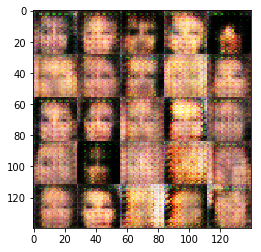

Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6912
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6913
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6912
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6913
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6913
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6913
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6913
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6913
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6914
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6915


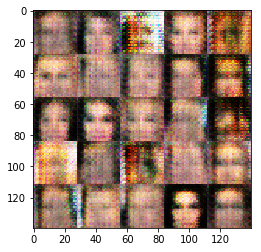

Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6914
Epoch 2/5... Discriminator Loss: 1.3868... Generator Loss: 0.6911
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6915
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6916
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6915
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6913
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6915
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6916
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6916
Epoch 2/5... Discriminator Loss: 1.3870... Generator Loss: 0.6912


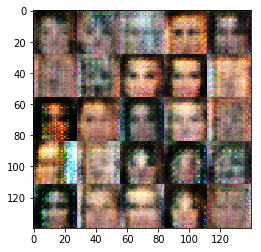

Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6916
Epoch 2/5... Discriminator Loss: 1.3861... Generator Loss: 0.6916
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6914
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6916
Epoch 2/5... Discriminator Loss: 1.3862... Generator Loss: 0.6917
Epoch 2/5... Discriminator Loss: 1.3861... Generator Loss: 0.6917
Epoch 2/5... Discriminator Loss: 1.3869... Generator Loss: 0.6913
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6917
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6916
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6914


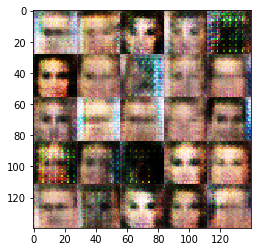

Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6916
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6917
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6916
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6917
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6918
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6918
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6916
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6917
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919


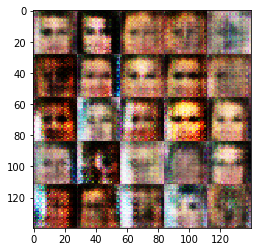

Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6918
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919


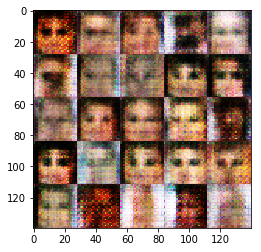

Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6920


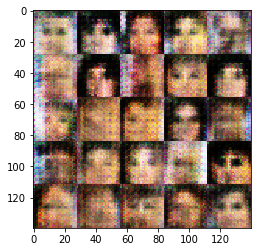

Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6918
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6920


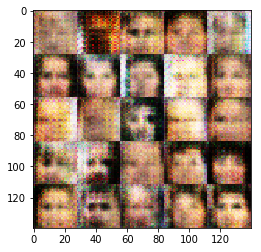

Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6917
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6921


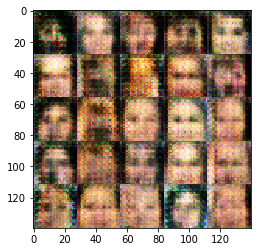

Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6919
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6922
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6922


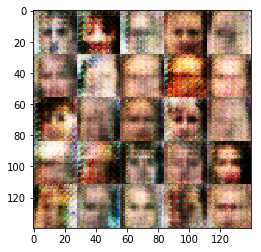

Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6922
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6922
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6922
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6922
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6922
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6922
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6922
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6917
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6921


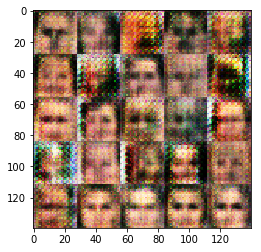

Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6915
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.3862... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3869... Generator Loss: 0.6916
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6922
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6920
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6922


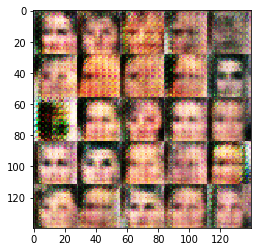

Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6922
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6923
Epoch 2/5... Discriminator Loss: 1.3863... Generator Loss: 0.6922
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3863... Generator Loss: 0.6923
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6923
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6921


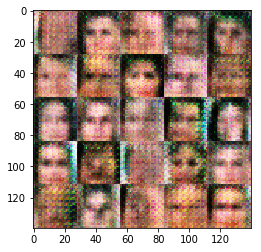

Epoch 2/5... Discriminator Loss: 1.3863... Generator Loss: 0.6923
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6922
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6923
Epoch 2/5... Discriminator Loss: 1.3867... Generator Loss: 0.6916
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6923
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6923
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6922
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6922
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6924


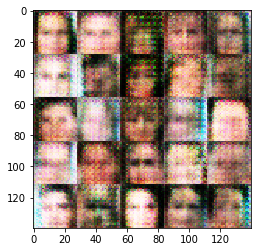

Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6923
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6922
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6924
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6924
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6924
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6924
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6924
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6923
Epoch 2/5... Discriminator Loss: 1.3866... Generator Loss: 0.6923


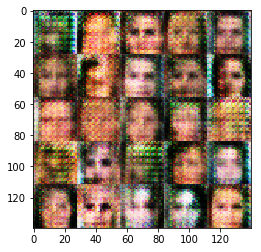

Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6924
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6924
Epoch 2/5... Discriminator Loss: 1.3868... Generator Loss: 0.6918
Epoch 2/5... Discriminator Loss: 1.3865... Generator Loss: 0.6924
Epoch 2/5... Discriminator Loss: 1.3863... Generator Loss: 0.6924
Epoch 2/5... Discriminator Loss: 1.3875... Generator Loss: 0.6906
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6924
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6924
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925


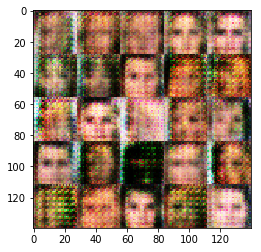

Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925


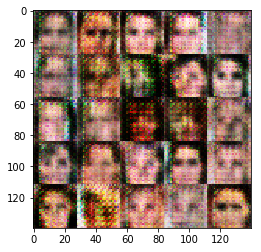

Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925


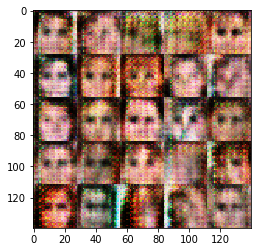

Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6926
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925


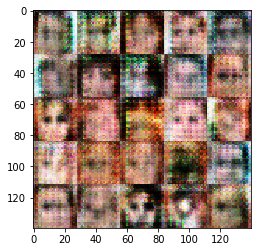

Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 2/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6924
Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6926


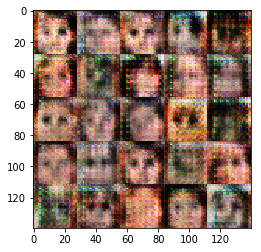

Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6924
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6924
Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6926


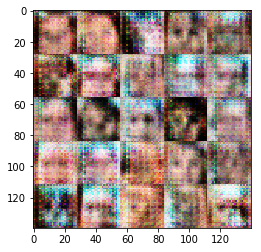

Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6924
Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6926


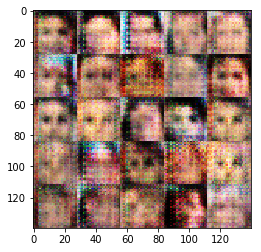

Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3866... Generator Loss: 0.6924
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3862... Generator Loss: 0.6926


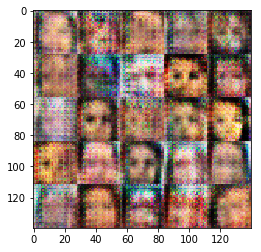

Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6924
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3862... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927


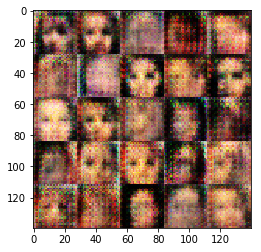

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3866... Generator Loss: 0.6924
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3870... Generator Loss: 0.6918
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927


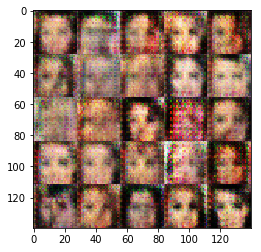

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3862... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927


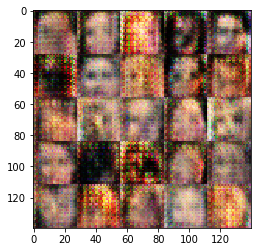

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3862... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3868... Generator Loss: 0.6919


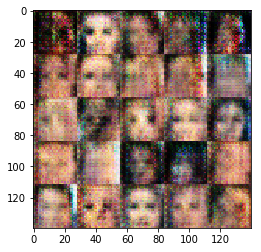

Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3867... Generator Loss: 0.6923
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928


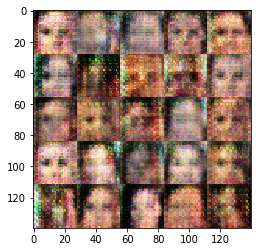

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928


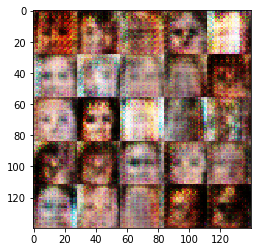

Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928


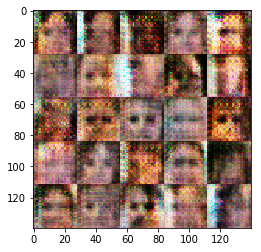

Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6927


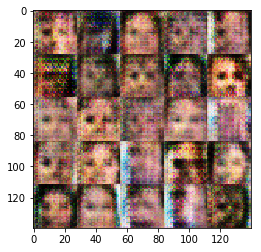

Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3861... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928


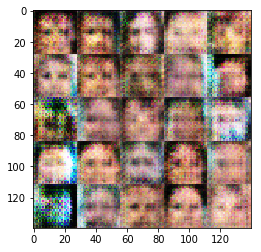

Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3866... Generator Loss: 0.6925


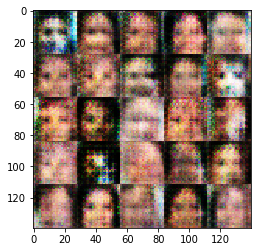

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3867... Generator Loss: 0.6923
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3862... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928


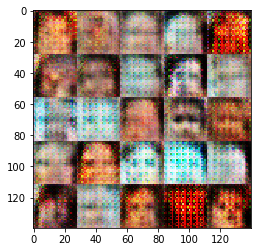

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3862... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3915... Generator Loss: 0.6850
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3902... Generator Loss: 0.6834


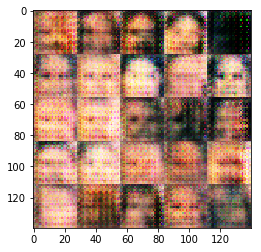

Epoch 3/5... Discriminator Loss: 1.3868... Generator Loss: 0.6924
Epoch 3/5... Discriminator Loss: 1.3866... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3867... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3866... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929


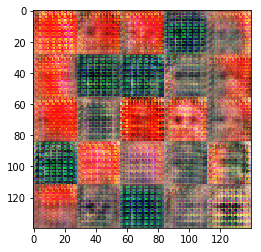

Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929


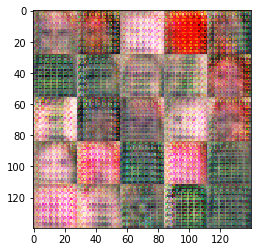

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929


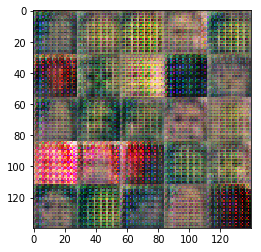

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929


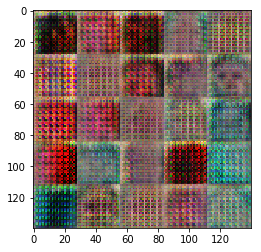

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929


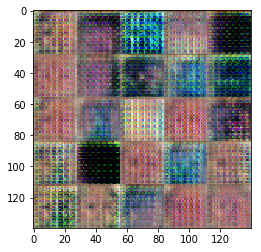

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3862... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3867... Generator Loss: 0.6925
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929


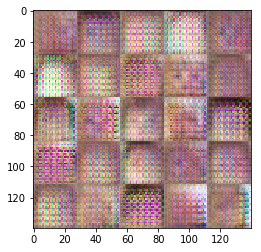

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930


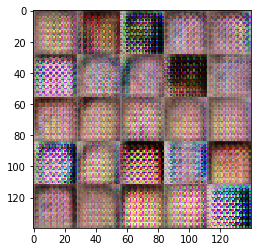

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3870... Generator Loss: 0.6920
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6928


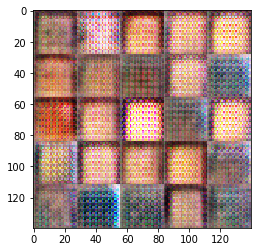

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930


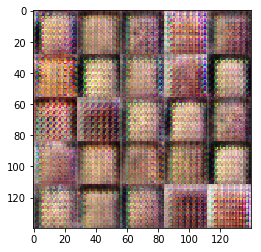

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930


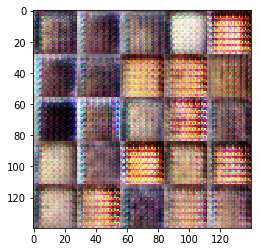

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6929


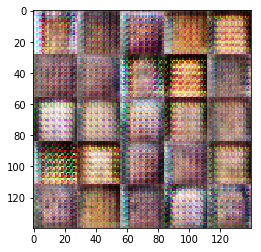

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930


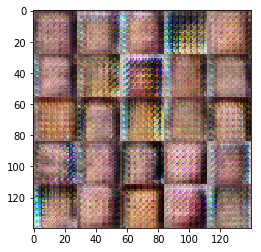

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930


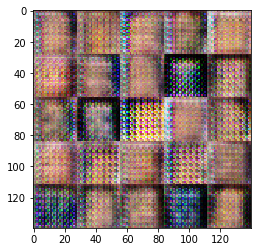

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3861... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3866... Generator Loss: 0.6926
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3864... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930


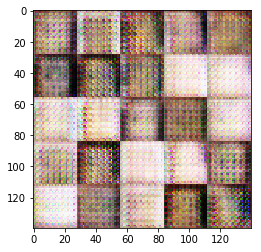

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930


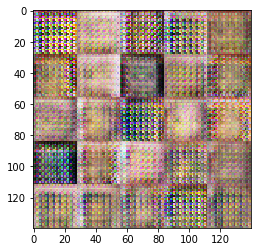

Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930


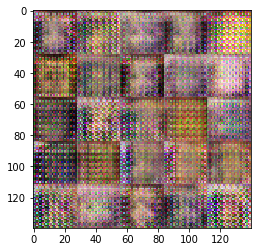

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930


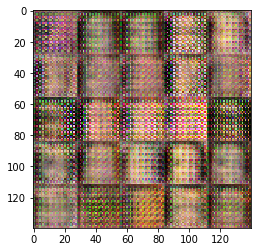

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930


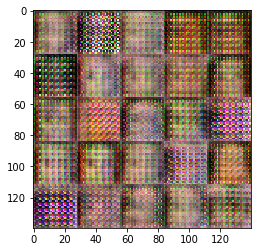

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930


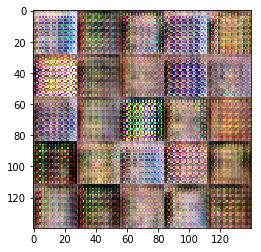

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


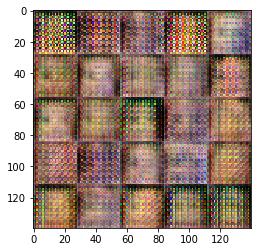

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


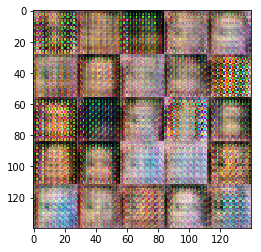

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


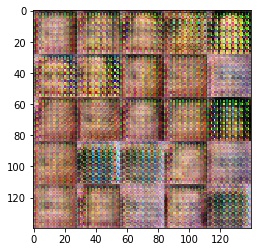

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


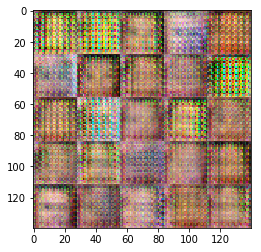

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


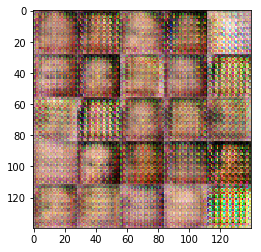

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


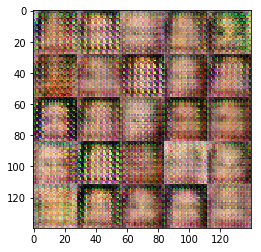

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


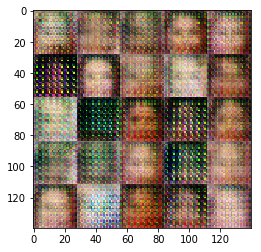

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


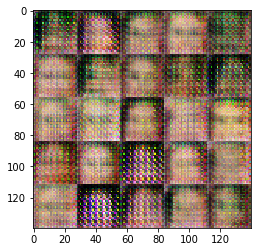

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


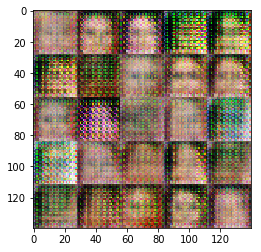

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


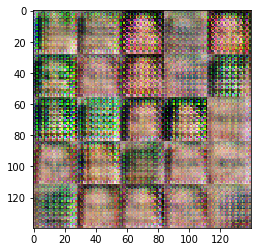

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


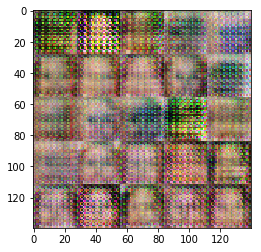

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


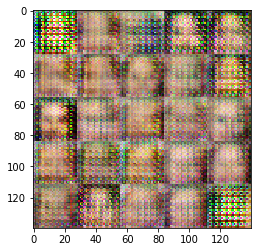

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


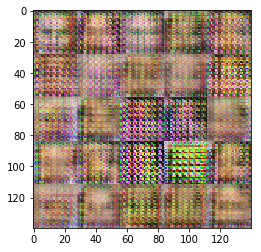

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


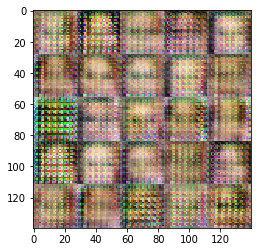

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


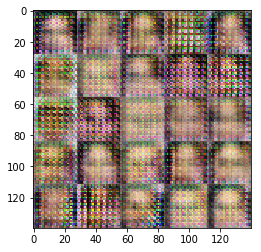

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


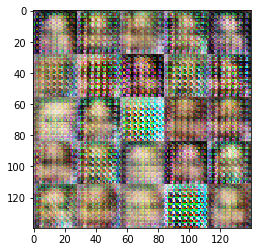

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


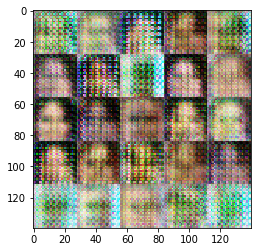

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


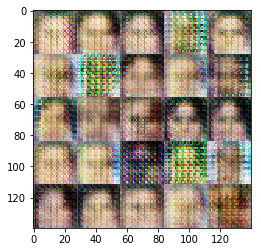

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


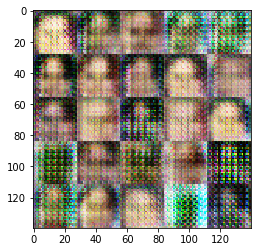

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


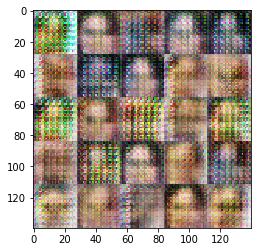

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


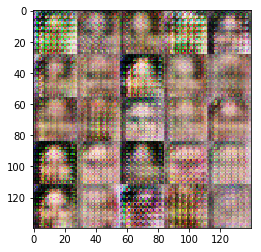

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


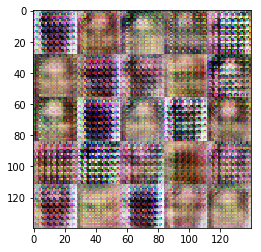

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


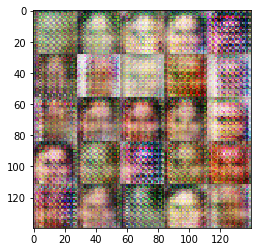

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


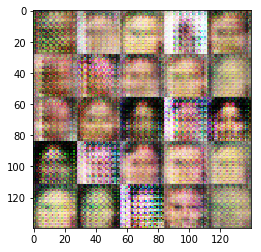

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


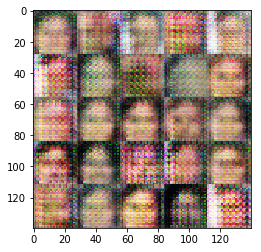

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


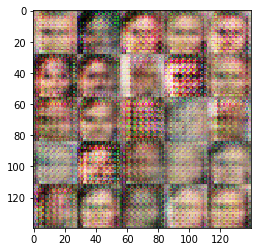

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


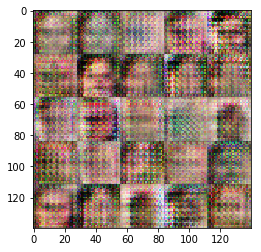

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


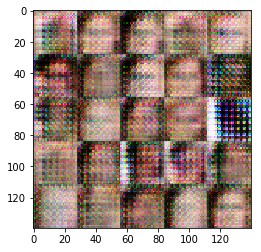

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


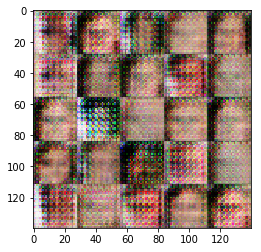

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


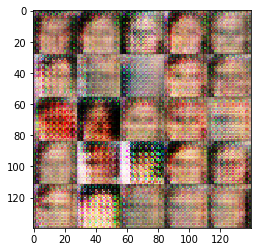

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


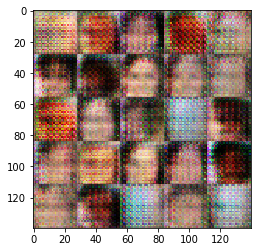

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


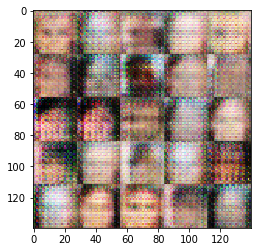

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


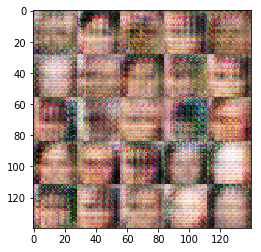

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


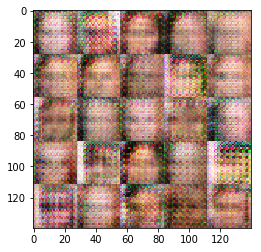

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


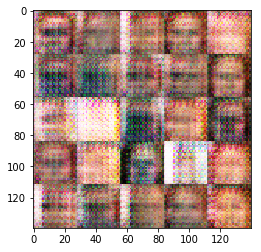

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


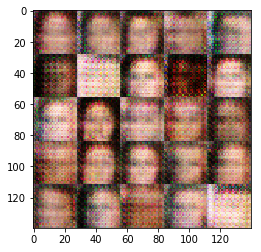

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


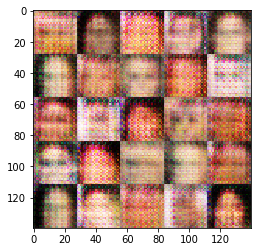

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


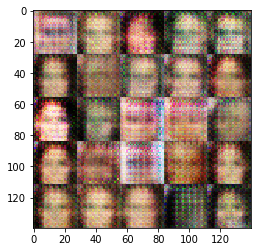

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


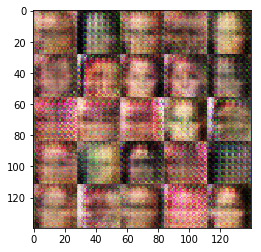

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


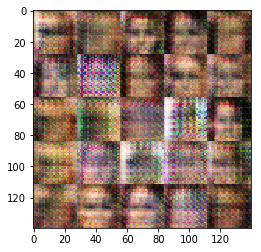

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


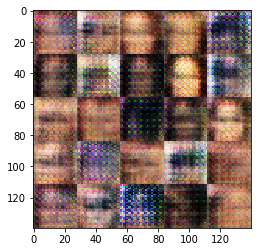

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


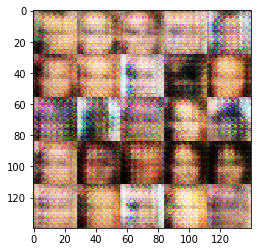

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


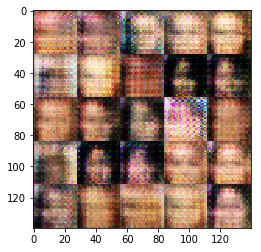

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


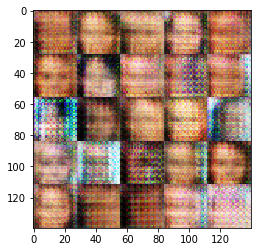

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


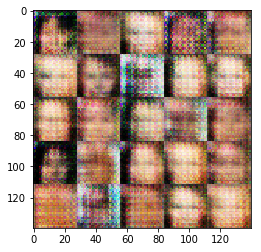

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


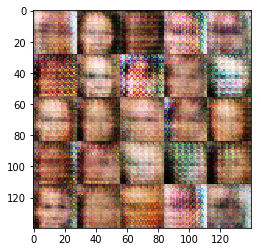

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


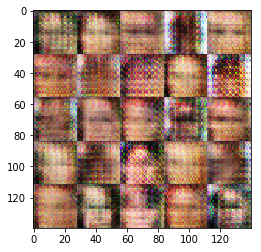

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


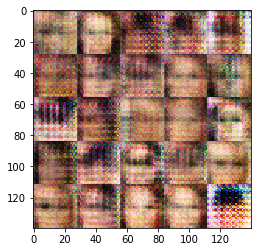

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


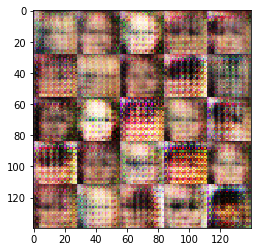

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


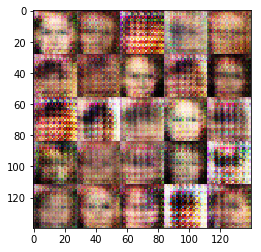

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


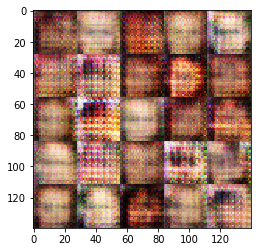

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


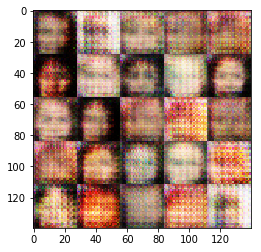

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


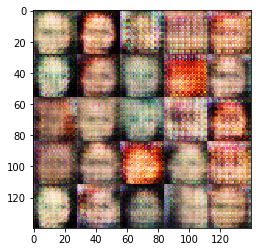

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


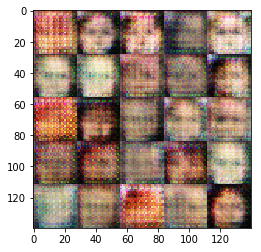

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


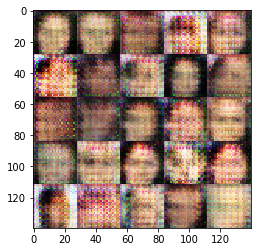

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


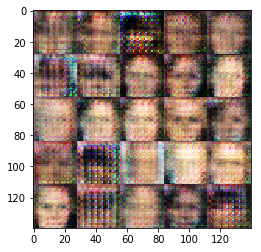

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


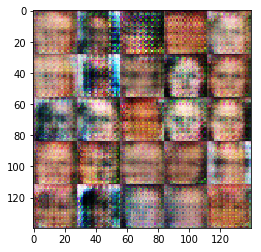

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


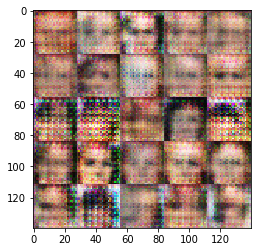

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


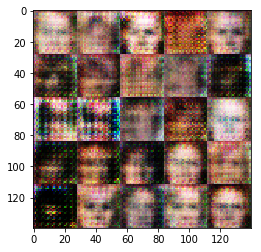

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


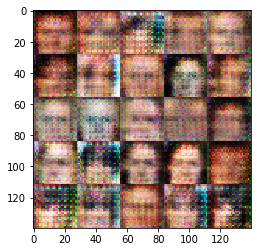

Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6931


In [13]:
batch_size = 64
z_dim = 128
learning_rate = 0.0001
beta1 = 0.5
tf.reset_default_graph()

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.